# Project: AlGaN/AlGaN/AlN HEMT device simulation using nexnano++ and nextnanopy

## 1. General settings

In [1]:
submit_cluster = False # Submit the job to the cluster or not.

### 1.1 Import modules

### 1.1.1 Adding local module path to python module search path

In [2]:
from pathlib import Path
import sys, os
current_script_path = Path().absolute()
module_path = os.path.abspath(os.path.join(current_script_path,'../..'))
sys.path.append(module_path)

#### 1.1.2 Import global modules

In [3]:
import shutil
import json
import nextnanopy as nn
from nextnanopy.utils.misc import mkdir_if_not_exist
import numpy as np
import scipy
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.patches as patches
import matplotlib.tri as tri 
import pandas as pd
from matplotlib.widgets import Slider

#### 1.1.2 Import local defined modules

In [4]:
%load_ext autoreload
%autoreload 2
from src.PlotFunctions import Plot1DFuns

lplt1d = Plot1DFuns()

### 1.2 Matplotlib settings

In [5]:
params = {'figure.figsize': (8, 6), 'legend.fontsize': 18, 'axes.labelsize': 24, 'axes.titlesize': 24,
          'xtick.labelsize':24, 'xtick.major.width':2, 'xtick.major.size':5, 'ytick.labelsize': 24,
          'ytick.major.width':2, 'ytick.major.size':5, 'xtick.minor.width':2, 'xtick.minor.size':3,
          'ytick.minor.width':2, 'ytick.minor.size':3, 'errorbar.capsize':2}
plt.rcParams.update(params)
plt.rc('font', size=24)

### 1.3 nextnanopy settings

In [6]:
#%% ===========================================================================
#++++++++++++++++++++++++++++++++++++++++++++++
# Software
#++++++++++++++++++++++++++++++++++++++++++++++
software_ = 'nextnano++'

#++++++++++++++++++++++++++++++++++++++++++++++
# NextNANO configuration file
#++++++++++++++++++++++++++++++++++++++++++++++
if submit_cluster:
    software_path = "/sfihome/local/rocks7-temp/codes/nextnano"
    software_executable = os.path.join(software_path, "RHEL/nextnano++_gcc_RHEL76_nextgen.exe")
    software_license = os.path.join(software_path, "License/license.txt") 
    software_database = os.path.join(software_path, "Database/database_nnp.in")
    
    nn.config.set(software_,'exe',software_executable)
    nn.config.set(software_,'runmode','--old')
    nn.config.set(software_,'license',software_license)
    nn.config.set(software_,'database',software_database)
    nn.config.set(software_,'outputdirectory','')
    
    nn.config.save() #save permanently

print(f'-nextnano config: {nn.config}')

-nextnano config: NNConfig(/home/Docs5/badal.mondal/linuxhome/.nextnanopy-config)
[nextnano++]
exe = /home/Docs5/badal.mondal/linuxhome/nextnano/2024_05_03/nextnano++/bin/nextnano++_gcc_Ubuntu.exe
license = /home/Docs5/badal.mondal/linuxhome/Licences/License_nnp.lic
database = /home/Docs5/badal.mondal/linuxhome/nextnano/2024_05_03/nextnano++/database/database_nnp.in
outputdirectory = /home/Docs5/badal.mondal/linuxhome/MyFolder/Projects/DeviceSimulation/nextnano_sim
threads = 0
[nextnano3]
exe = /home/Docs5/badal.mondal/linuxhome/nextnano/2024_05_03/nextnano3/bin/nextnano3_gcc_Ubuntu.exe
license = /home/Docs5/badal.mondal/linuxhome/Licences/License_nnp.lic
database = /home/Docs5/badal.mondal/linuxhome/nextnano/2024_05_03/nextnano3/database/database_nn3.in
threads = 0
outputdirectory = /home/Docs5/badal.mondal/linuxhome/MyFolder/Projects/DeviceSimulation/nextnano_sim
debuglevel = 0
cancel = -1
softkill = -1
[nextnano.NEGF]
exe = 
license = 
database = 
outputdirectory = 
threads = 0
[nex

### 1.4 Set tasks to perform

In [16]:
run_sim = False  # run single simulations
run_sweep = False # run sweep simulations
run_sim_specific_sample = False # run single simulation for specific sample device
run_sweep_specific_sample = False # run sweep simulation for specific sample device
create_data_sweep = True # create required data sheet from seep simulation results
do_plot = False  # plot results of single simulation
do_plot_sweep = True # plot results of sweep simulation
savefigure = True # save the figures generated

### 1.5 Input and output directories/files

In [27]:
#++++++++++++++++++++++++++++++++++++++++++++++
# Parent simulation folder
#++++++++++++++++++++++++++++++++++++++++++++++
sim_dir = str(current_script_path).split('SCRIPTs')[0]

#++++++++++++++++++++++++++++++++++++++++++++++
# Set input file 
#++++++++++++++++++++++++++++++++++++++++++++++
# extension of the input file
FileExtension = '.in' 
# inner location of input file within INPUTs folder
folder_input_lower_level = 'AlGaN_HEMT/AlGaN_AlGaN_AlN_HEMT/nnp/2DEHG_density/OneDim/single_E_sixKP_H'
# complete path of input file folder
folder_input_ = os.path.join(sim_dir, 'INPUTs', folder_input_lower_level)
# list of name of input files
input_filename_list = [r'sim.in']
# list of all input files complete path
input_files_dest = [os.path.join(folder_input_, fname) for fname in input_filename_list]

#++++++++++++++++++++++++++++++++++++++++++++++
# Create input file for specific sample
#++++++++++++++++++++++++++++++++++++++++++++++
# settings for specific sample(s)
specific_samples = {'Sample1': {'AlContentBarrier': 0.75, 
                                'AlContentChannel': 0.55, 
                                'ThicknessAlGaNBarrier': 42}
                    }
if run_sim_specific_sample or run_sweep_specific_sample:
    # base input file to use for creating specific sample
    base_input_file = input_filename_list[0]
    base_input_file_name = base_input_file.replace(FileExtension, '')
    input_path_ = os.path.join(folder_input_, base_input_file)
    # read base input file
    input_file = nn.InputFile(input_path_)
    if (not run_sim) and (not run_sweep): 
        input_files_dest = []
    # set-update parameters for specific sample(s)
    # temporarily save generated input files
    for specific_sample_params in specific_samples.values():
        add_ftext = ''
        for key, val in specific_sample_params.items():
            input_file.set_variable(key, value=val)
            add_ftext += f'_{key}_{val:.2f}'
        input_file_specific = f'specific_sample_{base_input_file_name}_{add_ftext}.in'
        input_path_specific = os.path.join(folder_input_, 'tmp', input_file_specific)
        input_file.save(input_path_specific, overwrite=True)
        input_files_dest.append(input_path_specific)
            
#++++++++++++++++++++++++++++++++++++++++++++++
# Simulation output path
#++++++++++++++++++++++++++++++++++++++++++++++
folder_output_ = os.path.join(sim_dir, 'OUTPUTs', folder_input_lower_level)
mkdir_if_not_exist(folder_output_)

#++++++++++++++++++++++++++++++++++++++++++++++
# Postprocess data path
#++++++++++++++++++++++++++++++++++++++++++++++
folder_post_data_ = os.path.join(sim_dir, 'DATAs', folder_input_lower_level)
mkdir_if_not_exist(folder_post_data_)

#++++++++++++++++++++++++++++++++++++++++++++++
# Figure folder path
#++++++++++++++++++++++++++++++++++++++++++++++
folder_figs_ = os.path.join(sim_dir, 'FIGs', folder_input_lower_level) 
mkdir_if_not_exist(folder_figs_)

#++++++++++++++++++++++++++++++++++++++++++++++
# Specify output image format: 
# ['.pdf','.svg','.jpg','.png']
#++++++++++++++++++++++++++++++++++++++++++++++
FigFormat = '.png'
FigDpi = 75

### 1.5 Sweep parameters

In [8]:
# Specify sweep variables:
# SweepVariablesSet = {name_of_set: {sweep_variable: [start value, end value, number of points]}}
# name_of_set == name of the set. choosen by user. arbitrary. 
# sweep_variable == name of sweep variable that you want to sweep. name must be in the input file.
SweepVariablesSet = { 
    'CompositionBThicknessScan' : 
                    {'AlContentBarrier'         : np.linspace( 0.5,   1.0, num=11), 
                     'AlContentChannel'         : np.linspace( 0.5,   1.0, num=11),
                     'ThicknessAlGaNBarrier'    : np.linspace( 5.0,  50.0, num=10)
                     },
    'SchottkyContactScan'       : 
                    {'SchottkyBarrierHeight'    : np.linspace( 0.0,   4.0, num= 9)},
    'BandgapBowingScan'         :
                    {'AlGaNbandgapBowing'       : [0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 1.1, 1.2, 1.3]},
    'PyroelectricBowingScan'    : 
                    {'AlGaNpyroelectricBowing'  : [-0.1, -0.021, 0.0]},
    'ChannelThicknessScan'      : 
                    {'ThicknessAlGaNChannel'    : np.linspace(50.0, 600.0, num=23)},
    'CompositionGradLengthScan2DEG' : 
                    {'CompositionGradLength2DEG': np.linspace( 2.0,  30.0, num=15)},
    'FixBarrierCompositionGradLengthScan2DEG' : 
                    {'CompositionGradLength2DEG': np.linspace( 2.0,  20.0, num=10)},
    'TemperatureScan'           : 
                    {'Temperature'              : np.linspace(50.0, 600.0, num=23)},
    'CompositionGradLengthScan2DHG' : 
                    {'CompositionGradLength2DHG': np.linspace(50.0,  200.0, num=4)}
}
SweepVariablesSet = { 
    'CompositionGradLengthScan2DEG' : 
                    {'CompositionGradLength2DEG': np.linspace( 2.0,  30.0, num=15)}
}

# For specific samples only sweep channel thickness and composition gradient
SpecificSamplesCase = ['ChannelThicknessScan', 'CompositionGradLengthScan2DEG', 'TemperatureScan']

##=============================================================================
## Functions to screen conditional sweep variables set
# Note: Nextnanopy still did not include this functionality. I locally modified my installation of
# nextnanopy to accept this function. 
# Refer to: https://github.com/nextnanopy/nextnanopy/issues/12
def condition_screen_fn(combination):
    '''
    Returns variables combination where AlContentBarrier >  AlContentChannel.
    '''
    SweepVariablesKeys = list(SweepVariables.keys())
    i_index = SweepVariablesKeys.index("AlContentBarrier")
    j_index = SweepVariablesKeys.index("AlContentChannel")
    if combination[i_index] > combination[j_index]:
        return True
    return False

## 2. Perform simulations

In [9]:
for input_path in input_files_dest:
    print(f"{'*'*72}")
    #==============================================================================
    # run nextnano simulation for single set of variables
    if run_sim or run_sim_specific_sample:
        print('* Running single parameter set simulation...')
        print(f'- Input file: {input_path}')
        input_file = nn.InputFile(input_path)
        # print(f"List of variables: {input_file.variables}")
        # for var in input_file.variables.values():
        #     print(f'{var.text}') 
        input_file.execute(outputdirectory=folder_output_, convergenceCheckbool=True)
    
    #==============================================================================    
    # run nextnano sweep simulation
    if run_sweep or run_sweep_specific_sample:
        print('* Running sweep simulation...')
        print(f'- Input file for Sweeping: {input_path}')
        
        #***************************************************************************
        # loop over sweep sets defined above
        for ScanVariableName, SweepVariables in SweepVariablesSet.items():
            if 'specific_sample_' in input_path and ScanVariableName not in SpecificSamplesCase:
                continue
            if 'FixBarrier' in ScanVariableName:
                # read old input file
                input_file = nn.InputFile(input_path)
                old_input_path = input_path
                # turn on composition gradient keyword
                input_file.set_variable('EffectiveBarrier', value=0)
                input_path = os.path.join(folder_input_, 'tmp', 'fix_barrier.in')
                input_file.save(input_path, overwrite=True)
                
            print(f"{'='*52}")
            print(f'- Sweeping set: {ScanVariableName}...')
            print(f'- Sweeping variables: {list(SweepVariables.keys())}')
            sweep = nn.Sweep(SweepVariables, input_path)
            if ScanVariableName == 'CompositionBThicknessScan':
                sweep.save_sweep(delete_old_files = True, variables_comb_screen_fns=condition_screen_fn)
            else:
                sweep.save_sweep(delete_old_files = True)
            sweep.execute_sweep(delete_input_files=True, outputdirectory=folder_output_,
                                overwrite=True, convergenceCheckbool=True, show_log=False)   

            if 'FixBarrier' in ScanVariableName:
                input_path = old_input_path

    #==============================================================================
    # remove temporary folder
    shutil.rmtree(os.path.join(folder_input_, 'tmp'), ignore_errors=True) 
    #==============================================================================

************************************************************************


## 3. Create post-processed data sheet from sweep simulations

In [24]:
if create_data_sweep:
    for input_path in input_files_dest:
        print(f"{'*'*72}")
        input_filename = input_path.split('/')[-1]
        input_file_name_variable = input_filename.replace(FileExtension, '')   
        print('* Sweep plotting...')
        
        #==============================================================================
        # loop over sweep sets defined above
        for ScanVariableName, SweepVariables in SweepVariablesSet.items():
            if 'specific_sample_' in input_filename and ScanVariableName not in SpecificSamplesCase:
                continue
            
            #***************************************************************************
            # Set the output folder path
            SweepVariablesKeys = list(SweepVariables.keys())
            SweepVariablesFolder ='__'.join(SweepVariablesKeys)
            
            if 'FixBarrier' in ScanVariableName:
                sweep_folder_path = os.path.join(folder_output_, f'fix_barrier_sweep__{SweepVariablesFolder}')
            else:
                sweep_folder_path = os.path.join(folder_output_, f'{input_file_name_variable}_sweep__{SweepVariablesFolder}')
            print(f'- Output data folder: {sweep_folder_path}')
            print(f'- Sweep variables: {SweepVariablesKeys}')
            
            #***************************************************************************
            # Read the sweep information from the output folder
            data_folder_ = nn.DataFolder(sweep_folder_path)
            sweep_info_file = data_folder_.file('sweep_infodict.json')
            
            with open(sweep_info_file) as json_file:
                sweep_info_data = json.load(json_file)    
            #print(f'Sweep information: {sweep_info_data}')
            
            #***************************************************************************
            # Set figures directory
            output_figs_sweep = data_folder_.fullpath.replace('OUTPUTs','FIGs')
            mkdir_if_not_exist(output_figs_sweep) 
            print(f'- Figs directory: {output_figs_sweep}')
            
            #=============================================================================================
            df = pd.DataFrame()
            print(f'- Data format:\n\t--Sweep_variables_set\n\t\t---{what_to_plots}')
            for sweep_var_file in sweep_info_data:
                df2_dict = sweep_info_data[sweep_var_file]
                sweep_var_value = [sweep_info_data[sweep_var_file][sweep_variable_] for sweep_variable_ in SweepVariables]
                s_data_folder = data_folder_.go_to(sweep_var_file)
                for ii, plot_file in enumerate(plot_data_files):
                    get_file_loc = nn.DataFile(s_data_folder.file(plot_file), product=software_)
                    df2_dict[what_to_plots[ii]] = get_file_loc.variables['Whole_Device'].value[0]
                    
                df = pd.concat([df, pd.DataFrame([df2_dict])], ignore_index=True)

************************************************************************
* Sweep plotting...
- Output data folder: /home/Docs5/badal.mondal/linuxhome/MyFolder/Projects/DeviceSimulation/nextnano_sim/OUTPUTs/AlGaN_HEMT/AlGaN_AlGaN_AlN_HEMT/nnp/2DEHG_density/OneDim/single_E_sixKP_H/sim_sweep__CompositionGradLength2DEG
- Sweep variables: ['CompositionGradLength2DEG']
- Figs directory: /home/Docs5/badal.mondal/linuxhome/MyFolder/Projects/DeviceSimulation/nextnano_sim/FIGs/AlGaN_HEMT/AlGaN_AlGaN_AlN_HEMT/nnp/2DEHG_density/OneDim/single_E_sixKP_H/sim_sweep__CompositionGradLength2DEG
- Data format:
	--Sweep_variables_set
		---['2DEG', '2DHG']


In [25]:
with pd.ExcelWriter(f'{folder_post_data_}/post_process_data.xlsx') as writer:  
    sheet_name_ = ''
    df.to_excel(writer, sheet_name='Sheet_name_1')

    df2.to_excel(writer, sheet_name='Sheet_name_2')

,CompositionGradLength2DEG,2DEG,2DHG
0,2.0,1.221705e+13,1.748417e+13
1,4.0,1.184578e+13,1.748541e+13
2,6.0,1.146543e+13,1.748644e+13
3,8.0,1.106339e+13,1.748724e+13
4,10.0,1.062751e+13,1.748788e+13
5,12.0,1.015243e+13,1.748843e+13
6,14.0,9.634774e+12,1.748891e+13
7,16.0,9.072698e+12,1.748935e+13
8,18.0,8.466101e+12,1.748975e+13
9,20.0,7.816914e+12,1.749013e+13


## 3. Plottings

### 3.1 Plot band diagram from single simulation results

In [10]:
if do_plot:
    for input_path in input_files_dest:
        print(f"{'*'*72}")
        input_filename = input_path.split('/')[-1]
        input_file_name_variable = input_filename.replace(FileExtension, '')
        data_folder_ = nn.DataFolder(f'{folder_output_}/{input_file_name_variable}')
        output_figs = data_folder_.fullpath.replace('OUTPUTs','FIGs')

        lplt1d.PlotBandDiagrams(data_folder_, output_figs, FigDpi=FigDpi,
                                show_doping=False, show_Qregion=True, savefigure=savefigure)

### 3.2 Plot band diagram from sweep results

************************************************************************
- Output data folder: /home/Docs5/badal.mondal/linuxhome/MyFolder/Projects/DeviceSimulation/nextnano_sim/OUTPUTs/AlGaN_HEMT/AlGaN_AlGaN_AlN_HEMT/nnp/2DEHG_density/OneDim/single_E_sixKP_H/sim_sweep__CompositionGradLength2DEG
- Sweep variables: ['CompositionGradLength2DEG']
- Output data folder: /home/Docs5/badal.mondal/linuxhome/MyFolder/Projects/DeviceSimulation/nextnano_sim/OUTPUTs/AlGaN_HEMT/AlGaN_AlGaN_AlN_HEMT/nnp/2DEHG_density/OneDim/single_E_sixKP_H/sim_sweep__CompositionGradLength2DEG/sim__CompositionGradLength2DEG_2.0_
- Output data folder: /home/Docs5/badal.mondal/linuxhome/MyFolder/Projects/DeviceSimulation/nextnano_sim/OUTPUTs/AlGaN_HEMT/AlGaN_AlGaN_AlN_HEMT/nnp/2DEHG_density/OneDim/single_E_sixKP_H/sim_sweep__CompositionGradLength2DEG/sim__CompositionGradLength2DEG_4.0_
- Output data folder: /home/Docs5/badal.mondal/linuxhome/MyFolder/Projects/DeviceSimulation/nextnano_sim/OUTPUTs/AlGaN_HEMT/AlGaN_AlGa

/home/Docs5/badal.mondal/linuxhome/MyFolder/Projects/DeviceSimulation/nextnano_sim/SCRIPTs/AlGaN_HEMT/src/PlotFunctions.py:186: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax0, ax) = plt.subplots(2,1, height_ratios=[1, 6], sharex=True, constrained_layout=True)


- Output data folder: /home/Docs5/badal.mondal/linuxhome/MyFolder/Projects/DeviceSimulation/nextnano_sim/OUTPUTs/AlGaN_HEMT/AlGaN_AlGaN_AlN_HEMT/nnp/2DEHG_density/OneDim/single_E_sixKP_H/sim_sweep__CompositionGradLength2DEG/sim__CompositionGradLength2DEG_16.0_
- Output data folder: /home/Docs5/badal.mondal/linuxhome/MyFolder/Projects/DeviceSimulation/nextnano_sim/OUTPUTs/AlGaN_HEMT/AlGaN_AlGaN_AlN_HEMT/nnp/2DEHG_density/OneDim/single_E_sixKP_H/sim_sweep__CompositionGradLength2DEG/sim__CompositionGradLength2DEG_18.0_
- Output data folder: /home/Docs5/badal.mondal/linuxhome/MyFolder/Projects/DeviceSimulation/nextnano_sim/OUTPUTs/AlGaN_HEMT/AlGaN_AlGaN_AlN_HEMT/nnp/2DEHG_density/OneDim/single_E_sixKP_H/sim_sweep__CompositionGradLength2DEG/sim__CompositionGradLength2DEG_20.0_
- Output data folder: /home/Docs5/badal.mondal/linuxhome/MyFolder/Projects/DeviceSimulation/nextnano_sim/OUTPUTs/AlGaN_HEMT/AlGaN_AlGaN_AlN_HEMT/nnp/2DEHG_density/OneDim/single_E_sixKP_H/sim_sweep__CompositionGradLeng

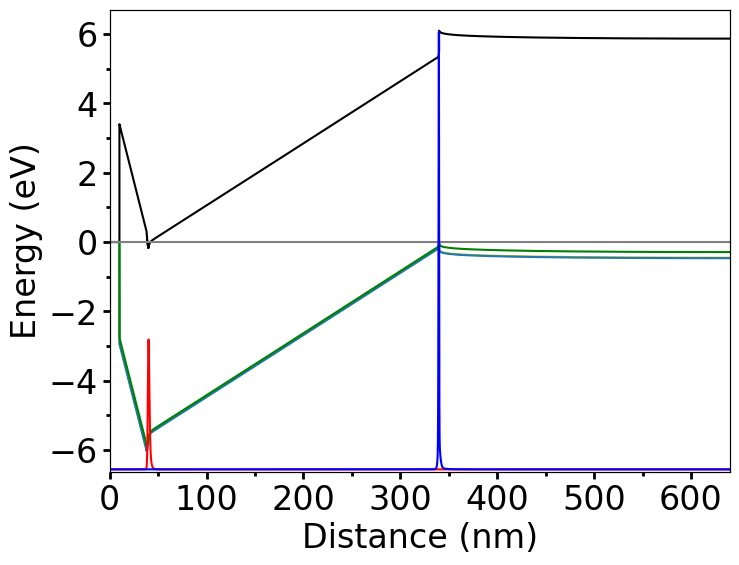

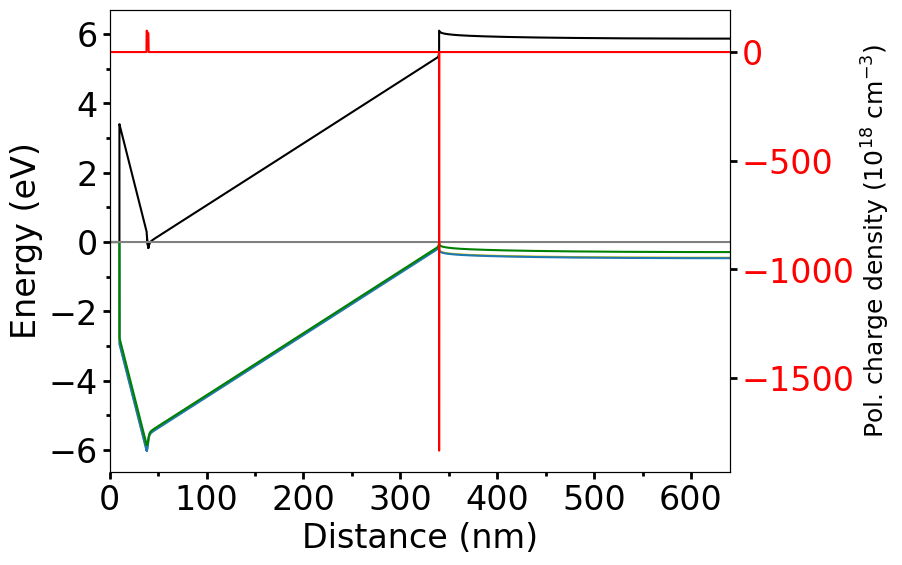

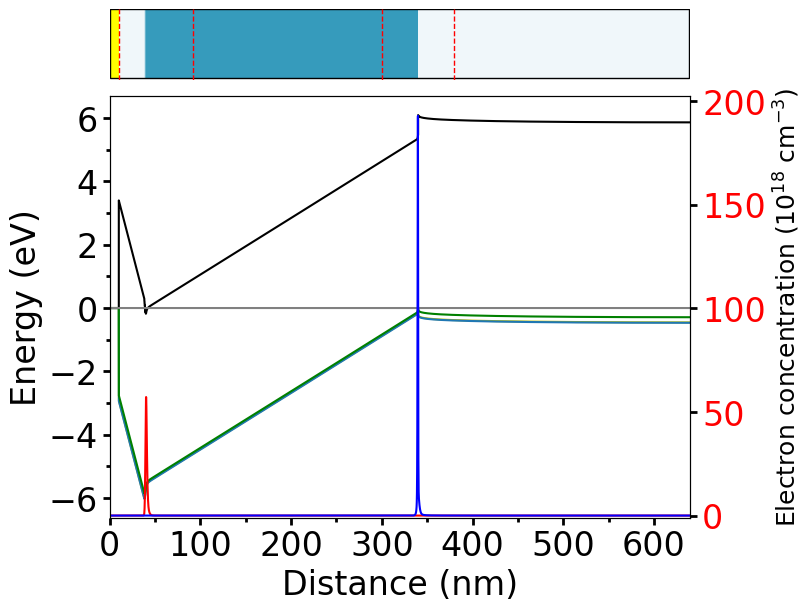

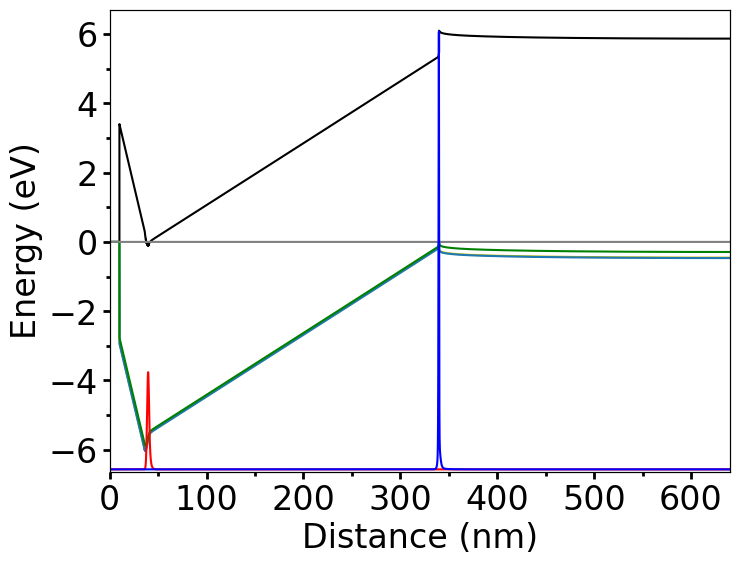

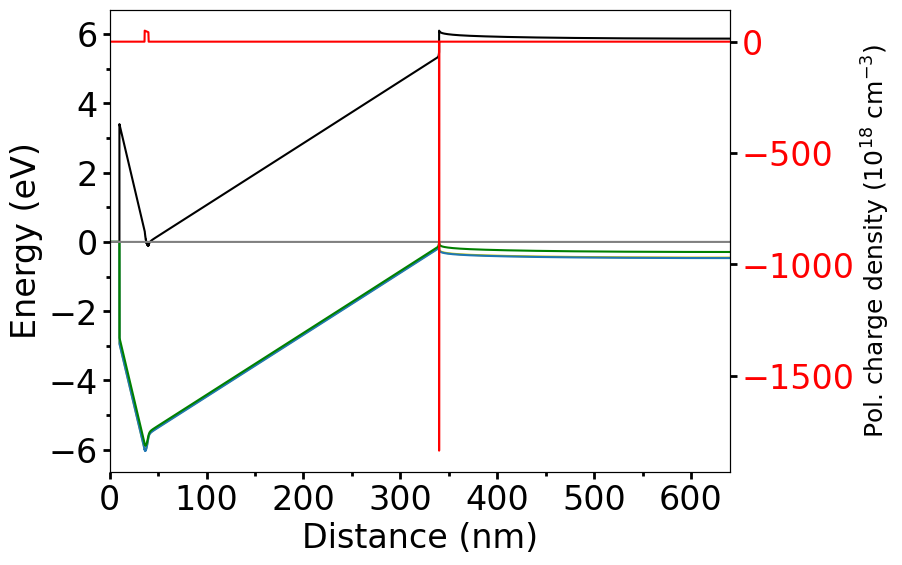

...

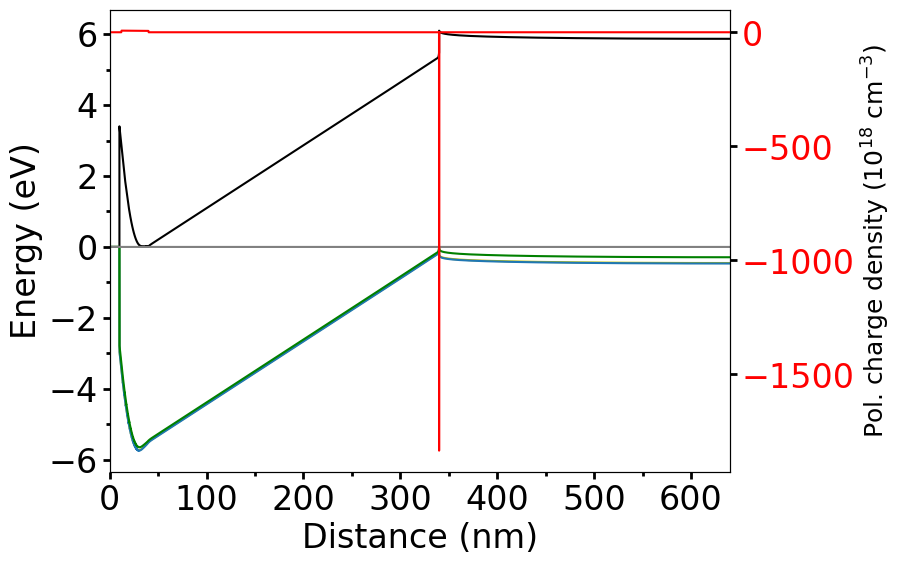

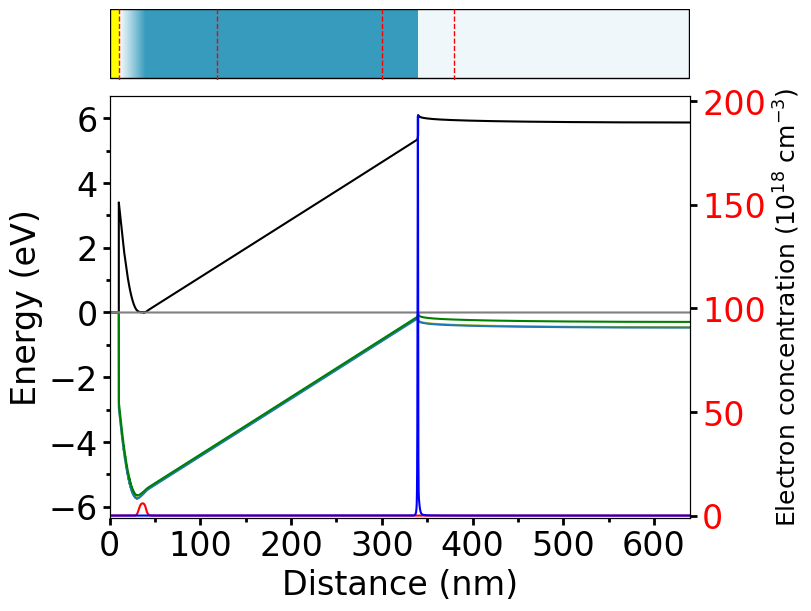

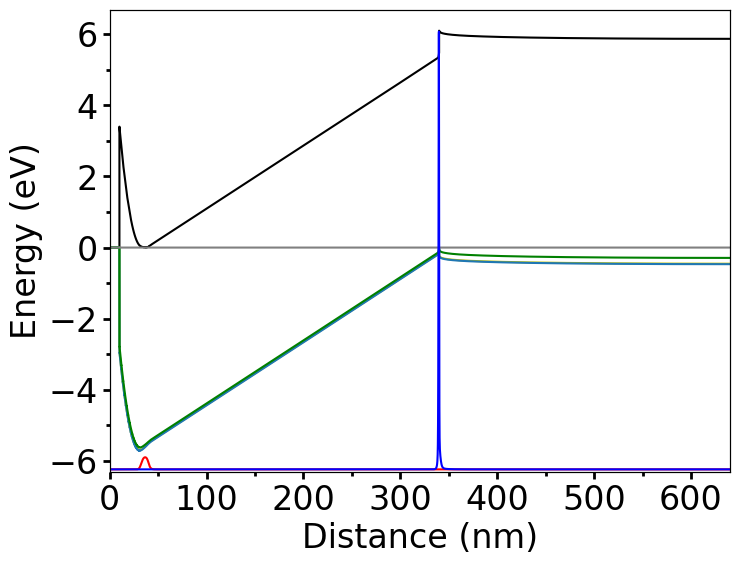

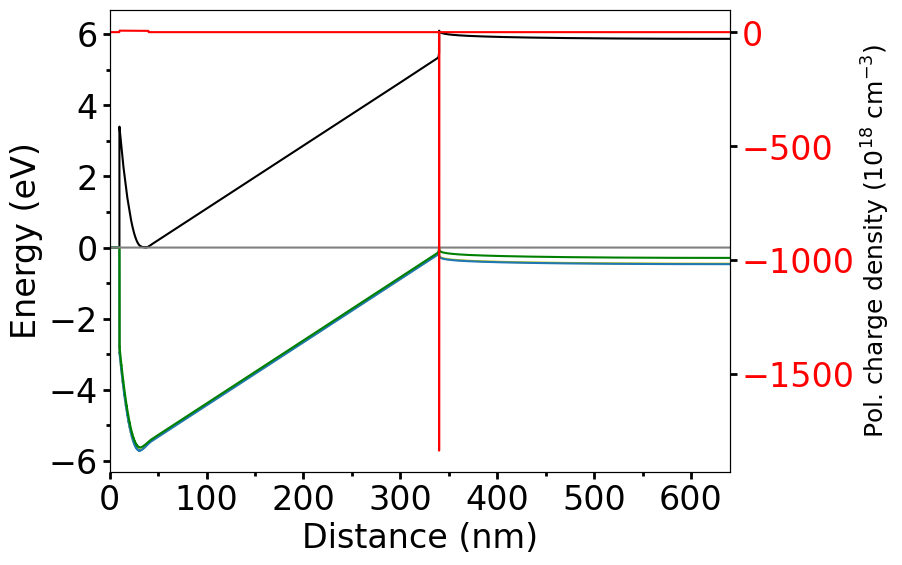

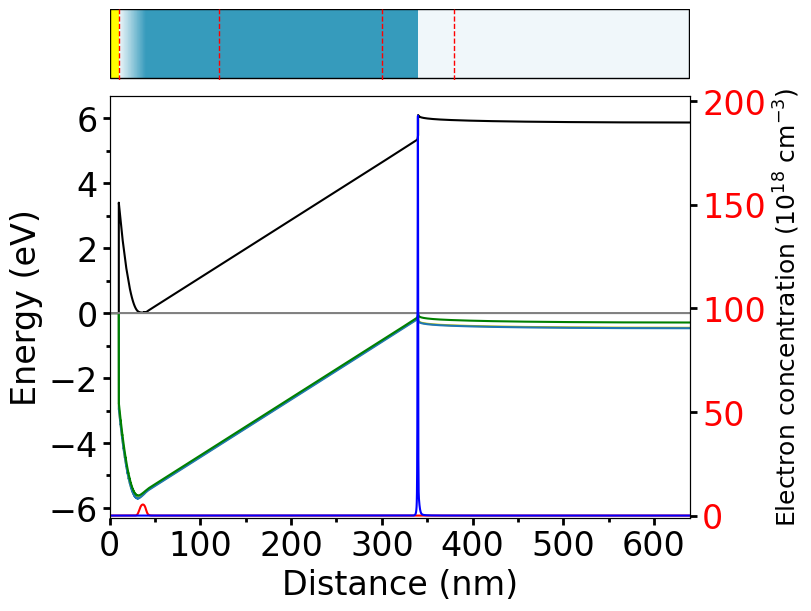

In [11]:
if do_plot_sweep:
    for input_path in input_files_dest:
        print(f"{'*'*72}")
        input_filename = input_path.split('/')[-1]
        input_file_name_variable = input_filename.replace(FileExtension, '')
        for ScanVariableName, SweepVariables in SweepVariablesSet.items():
            if 'specific_sample_' in input_filename and ScanVariableName not in SpecificSamplesCase:
                continue
            
            #=============================================================================================
            SweepVariablesKeys = list(SweepVariables.keys())  
            SweepVariablesFolder ='__'.join(SweepVariablesKeys)
            
            if 'FixBarrier' in ScanVariableName:
                sweep_folder_path = os.path.join(folder_output_, f'fix_barrier_sweep__{SweepVariablesFolder}')
            else:
                sweep_folder_path = os.path.join(folder_output_, f'{input_file_name_variable}_sweep__{SweepVariablesFolder}')
            
            print(f'- Output data folder: {sweep_folder_path}')
            print(f'- Sweep variables: {SweepVariablesKeys}')
            
            #=============================================================================================
            data_folder_ = nn.DataFolder(sweep_folder_path)
            sweep_info_file = data_folder_.file('sweep_infodict.json')
            
            with open(sweep_info_file) as json_file:
                sweep_info_data = json.load(json_file)   
                for sweep_folder_path_ in sweep_info_data:
                    data_folder_sweep = nn.DataFolder(sweep_folder_path_)
                    output_figs_sweep = data_folder_sweep.fullpath.replace('OUTPUTs','FIGs')
                    lplt1d.PlotBandDiagrams(data_folder_sweep, output_figs_sweep, FigDpi=FigDpi,
                                            show_doping=False, show_Qregion=True, savefigure=savefigure)

#### 3.2.1 Set folder path for Sweep simulations run

In [12]:
## Data files for: 2DEG, 2DHG
what_to_plots = ['2DEG', '2DHG']
plot_data_files = ['integrated_density_electron.dat', 'integrated_density_hole.dat']
rescale_2deg_fact = 1e13  # Rescalings 2DEG in 10^13 unit
show_log_scale = False

************************************************************************
* Sweep plotting...
- Output data folder: /home/Docs5/badal.mondal/linuxhome/MyFolder/Projects/DeviceSimulation/nextnano_sim/OUTPUTs/AlGaN_HEMT/AlGaN_AlGaN_AlN_HEMT/nnp/2DEHG_density/OneDim/single_E_sixKP_H/sim_sweep__CompositionGradLength2DEG
- Sweep variables: ['CompositionGradLength2DEG']
- Figs directory: /home/Docs5/badal.mondal/linuxhome/MyFolder/Projects/DeviceSimulation/nextnano_sim/FIGs/AlGaN_HEMT/AlGaN_AlGaN_AlN_HEMT/nnp/2DEHG_density/OneDim/single_E_sixKP_H/sim_sweep__CompositionGradLength2DEG
- Data format:
	--Sweep_variables_set
		---['2DEG', '2DHG']


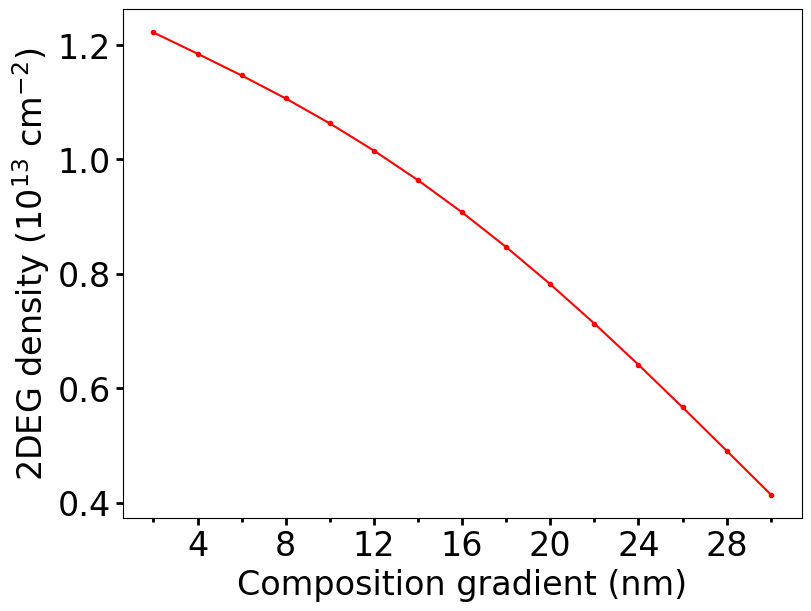

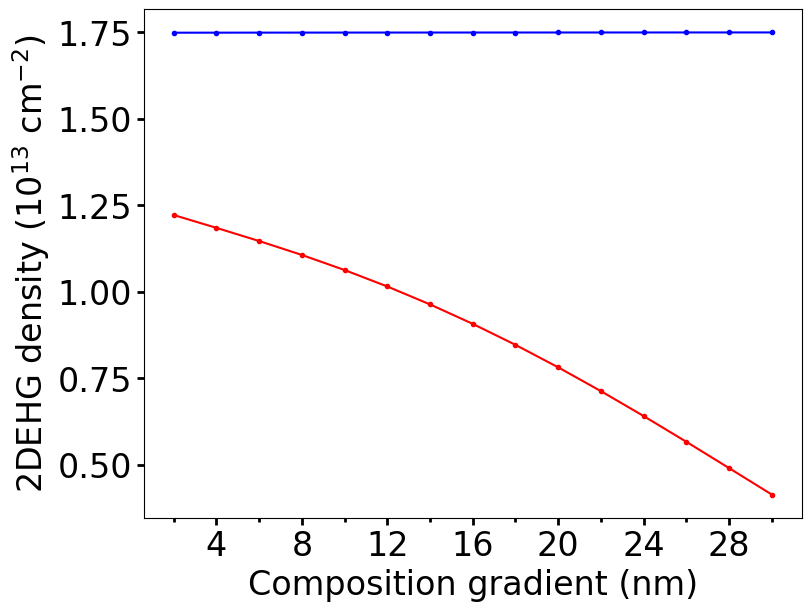

In [14]:
if do_plot_sweep:
    for input_path in input_files_dest:
        print(f"{'*'*72}")
        input_filename = input_path.split('/')[-1]
        input_file_name_variable = input_filename.replace(FileExtension, '')   
        print('* Sweep plotting...')
        
        for ScanVariableName, SweepVariables in SweepVariablesSet.items():
            if 'specific_sample_' in input_filename and ScanVariableName not in SpecificSamplesCase:
                continue
            
            #=============================================================================================
            # Set the output folder path
            SweepVariablesKeys = list(SweepVariables.keys())
            SweepVariablesFolder ='__'.join(SweepVariablesKeys)
            
            if 'FixBarrier' in ScanVariableName:
                sweep_folder_path = os.path.join(folder_output_, f'fix_barrier_sweep__{SweepVariablesFolder}')
            else:
                sweep_folder_path = os.path.join(folder_output_, f'{input_file_name_variable}_sweep__{SweepVariablesFolder}')
            print(f'- Output data folder: {sweep_folder_path}')
            print(f'- Sweep variables: {SweepVariablesKeys}')
            
            #=============================================================================================
            # Read the sweep information from the output folder
            data_folder_ = nn.DataFolder(sweep_folder_path)
            sweep_info_file = data_folder_.file('sweep_infodict.json')
            
            with open(sweep_info_file) as json_file:
                sweep_info_data = json.load(json_file)    
            #print(f'Sweep information: {sweep_info_data}')
            
            #=============================================================================================
            # Set figures directory
            output_figs_sweep = data_folder_.fullpath.replace('OUTPUTs','FIGs')
            mkdir_if_not_exist(output_figs_sweep) 
            print(f'- Figs directory: {output_figs_sweep}')
            
            #=============================================================================================
            df = pd.DataFrame()
            print(f'- Data format:\n\t--Sweep_variables_set\n\t\t---{what_to_plots}')
            for sweep_var_file in sweep_info_data:
                df2_dict = sweep_info_data[sweep_var_file]
                sweep_var_value = [sweep_info_data[sweep_var_file][sweep_variable_] for sweep_variable_ in SweepVariables]
                s_data_folder = data_folder_.go_to(sweep_var_file)
                for ii, plot_file in enumerate(plot_data_files):
                    get_file_loc = nn.DataFile(s_data_folder.file(plot_file), product=software_)
                    df2_dict[what_to_plots[ii]] = get_file_loc.variables['Whole_Device'].value[0]
                    
                df = pd.concat([df, pd.DataFrame([df2_dict])], ignore_index=True)
            df['2DEG_rescale'] =  df['2DEG'].copy()/rescale_2deg_fact
            df['2DHG_rescale'] =  df['2DHG'].copy()/rescale_2deg_fact
            
            if len(SweepVariablesKeys) > 1:
                df_cap_thickness_group = df.groupby(['ThicknessAlGaNBarrier']) # Group by thickness
                x_label_text = 'Al composition channel'
                y_label_text = 'Al composition barrier'
                z_label_text = ['2DEG density ($10^{13}$ $\\mathrm{cm}^{-2}$)',
                                '2DHG density ($10^{13}$ $\\mathrm{cm}^{-2}$)']
                #============ 2D plot =====================================================
                vmin, vmax = df['2DEG_rescale'].min(), df['2DEG_rescale'].max()
                print(vmin, vmax)
                #m = plt.cm.ScalarMappable(cmap=cm.coolwarm)
                #m.set_array(Z)
                #m.set_clim(0., 3.2)
                #plt.colorbar(m, boundaries=np.linspace(0, 3., 6))
                import matplotlib as mpl
                for iii, what_to_plot in enumerate(what_to_plots):
                    for name, group in df_cap_thickness_group:
                        print(f'Barrier thickness - {what_to_plot} = {name[0]:.2f} nm')
                        ##### 3.2.5.1 Generate data inculding interpolation
                        XX, YY, ZZ = group['AlContentChannel'], group['AlContentBarrier'], group[f'{what_to_plot}_rescale']   
                        # Triangulation
                        triang = tri.Triangulation(XX, YY) 
                        xi, yi = np.meshgrid(np.linspace(XX.min(), XX.max(), 20), np.linspace(YY.min(), YY.max(), 20))
                        # Linear interpolation
                        interp_lin = tri.LinearTriInterpolator(triang, ZZ)
                        zi_lin = interp_lin(xi, yi)
        
                        ##### 3.2.5.2 Plot composition map vs 2DEG
                        # Set up the figure
                        fig, axs = plt.subplots(figsize=(8, 6), constrained_layout=True)
        
                        # Plot linear interpolation to quad grid.
                        pcm0 = axs.contourf(xi, yi, zi_lin, vmin = 0, vmax = 3.2)
                        #axs.contour(cs, colors='k', linewidths=1)
                        # Plot the triangulation.
                        #cs = axs.tricontourf(triang, ZZ, vmin = vmin, vmax = vmax)
                        #axs.tricontour(cs, colors='k', linewidths=1)
                        axs.set_ylabel(y_label_text)
                        axs.set_xlabel(x_label_text)
                        axs.set_title(f"Barrier thickness = {name[0]:.2f} nm")
                        print(pcm0)
                        cbar = fig.colorbar(pcm0, ax=axs, location='right', label=z_label_text[iii],
                                           norm=mpl.colors.Normalize(vmin=0, vmax=3.2), boundaries=np.linspace(0, 3.2, 6))
                        #cbar.set_clim(0, 3.2)
                        #cbar =fig.colorbar(m, boundaries=np.linspace(0, 3., 6))
        
                        axs.xaxis.set_major_locator(ticker.MultipleLocator(base=0.1))
                        axs.xaxis.set_minor_locator(ticker.MultipleLocator(base=0.05))
                        axs.yaxis.set_major_locator(ticker.MultipleLocator(base=0.1))
                        axs.yaxis.set_minor_locator(ticker.MultipleLocator(base=0.05))
                        
                        if savefigure:
                            output_figs_sweep_tmp = os.path.join(output_figs_sweep, what_to_plot)
                            mkdir_if_not_exist(output_figs_sweep_tmp)
                            filename = f'Barrier_{name[0]:.2f}{FigFormat}'
                            fig.savefig(os.path.join(output_figs_sweep_tmp, filename)) 
                        #break
            
            #### 3.2.2 Plot 2DEG only data with Sweepvariable
            if len(SweepVariablesKeys) < 2:
                ticks_multiplicator = [None, None, None, None]
                if 'SchottkyBarrierHeight' in SweepVariablesKeys:
                    #x_label_text = 'Surface potential $e\\phi_B = \\mathrm{E}_C - \\mathrm{E}_F$ (eV)'
                    x_label_text = 'Barrier height (eV)'
                    # [xticks major multiplicator, xticks minor multiplicator, 
                    # yticks major multiplicator,yticks minor multiplicator]
                    ticks_multiplicator_plot1 = [1.0, 0.5, 0.1, 0.05]
                    ticks_multiplicator_plot2 = [1.0, 0.5, 0.1, 0.05]
                elif 'ThicknessAlGaNChannel' in SweepVariablesKeys:
                    x_label_text = 'Channel thickness (nm)'
                    ticks_multiplicator_plot1 = [100, 50, 0.1, 0.05]
                    ticks_multiplicator_plot2 = [100, 50, 0.2, 0.1]
                elif 'CompositionGradLength2DEG' in SweepVariablesKeys:
                    x_label_text = 'Composition gradient (nm)'
                    ticks_multiplicator_plot1 = [4, 2, None, None]
                    ticks_multiplicator_plot2 = [4, 2, None, None]
                elif 'Temperature' in SweepVariablesKeys:
                    x_label_text = 'Temperature (K)'
                    ticks_multiplicator_plot1 = [100, 50, None, None]
                    ticks_multiplicator_plot2 = [100, 50, None, None]
                elif 'AlGaNbandgapBowing' in SweepVariablesKeys:
                    x_label_text = 'Bandgap bowing (eV)'
                    ticks_multiplicator_plot1 = [0.2, 0.1, None, None]
                    ticks_multiplicator_plot2 = [0.2, 0.1, 0.1, 0.05]
                elif 'AlGaNpyroelectricBowing' in SweepVariablesKeys:
                    x_label_text = 'Pyroelectric bowing'
                    ticks_multiplicator_plot1 = [0.1, 0.1, 0.2, 0.1]
                    ticks_multiplicator_plot2 = [0.1, 0.1, 0.5, 0.25]
                
                #============ 1D plot =====================================================
                # Only 2DEG plot
                y_label_text = '2DEG density ($10^{13}$ $\\mathrm{cm}^{-2}$)'
                lplt1d.PlotSweepsData(df[SweepVariablesKeys[0]], df['2DEG_rescale'],
                                      x_label=x_label_text, y_label=y_label_text,
                                      tick_multiplicator=ticks_multiplicator_plot1,
                                      FigDpi=FigDpi, FigFormat=FigFormat,
                                      figs_path=output_figs_sweep, filename='2deg', 
                                      savefigure=savefigure)

                #### Plot 2DEG and 2DHG
                y_label_text = '2DEHG density ($10^{13}$ $\\mathrm{cm}^{-2}$)'
                fig, ax = lplt1d.PlotSweepsData(df[SweepVariablesKeys[0]], df['2DEG_rescale'],
                                                tick_multiplicator=ticks_multiplicator_plot1,
                                                FigDpi=FigDpi, FigFormat=FigFormat, color='r',
                                                figs_path=output_figs_sweep, filename='2deg',
                                                savefigure=False)
                fig, ax = lplt1d.PlotSweepsData(df[SweepVariablesKeys[0]], df['2DHG_rescale'],
                                                fig=fig, ax=ax, x_label=x_label_text, y_label=y_label_text,
                                                tick_multiplicator=ticks_multiplicator_plot2,
                                                FigDpi=FigDpi, FigFormat=FigFormat, color='b',
                                                figs_path=output_figs_sweep, filename='2deg',
                                                savefigure=True)
            #break
        #break

#### 3.2.5 Plot composition map vs 2DEG

In [60]:
df.loc[230]

AlloyContentCap        1.000000e+00
AlloyContentChannel    6.000000e-01
ThicknessAlGaNCap      3.500000e+01
2DEG                   2.566891e+13
2DHG                   2.711251e+13
Name: 230, dtype: float64

In [70]:
df['2DEG_rescale'] =  df['2DEG']/rescale_y_fact
df['2DHG_rescale'] =  df['2DHG']/rescale_y_fact

Cap layer thickness - 2DEG = 5.0
Cap layer thickness - 2DEG = 10.0
Cap layer thickness - 2DEG = 15.0
Cap layer thickness - 2DEG = 20.0
Cap layer thickness - 2DEG = 25.0
Cap layer thickness - 2DEG = 30.0
Cap layer thickness - 2DEG = 35.0
Cap layer thickness - 2DEG = 40.0
Cap layer thickness - 2DHG = 5.0
Cap layer thickness - 2DHG = 10.0
Cap layer thickness - 2DHG = 15.0
Cap layer thickness - 2DHG = 20.0
Cap layer thickness - 2DHG = 25.0
Cap layer thickness - 2DHG = 30.0
Cap layer thickness - 2DHG = 35.0
Cap layer thickness - 2DHG = 40.0


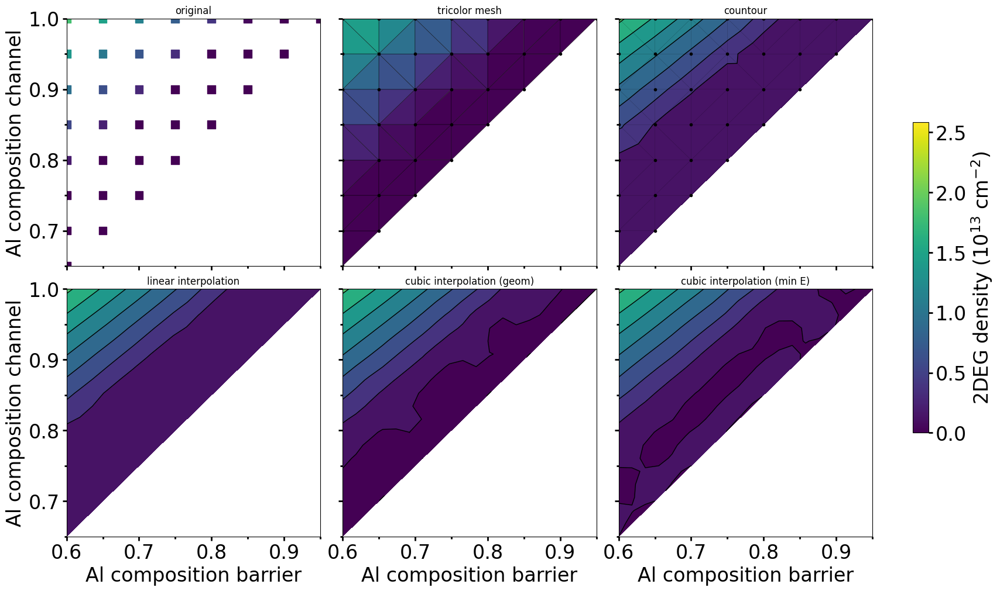

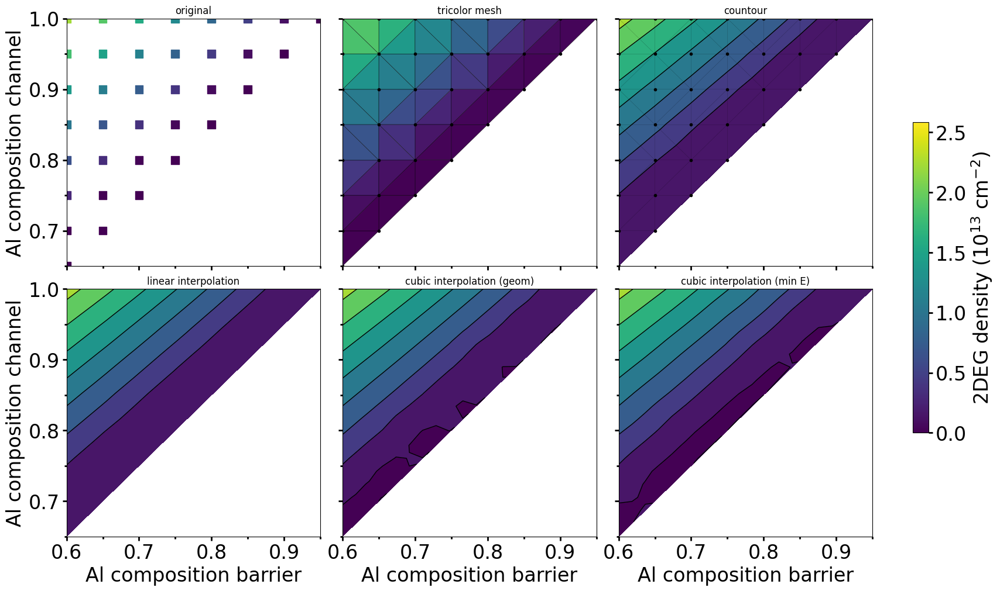

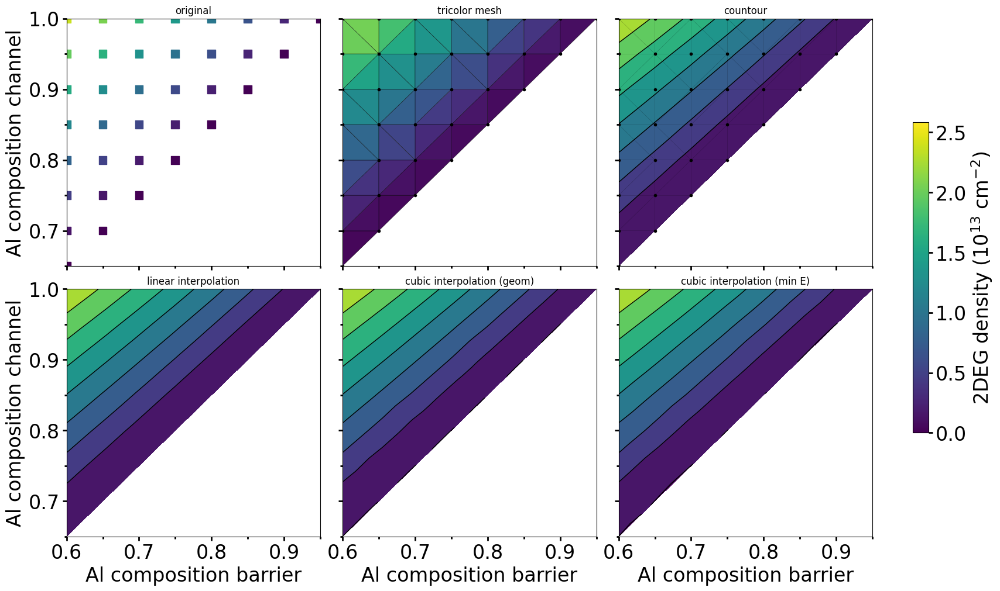

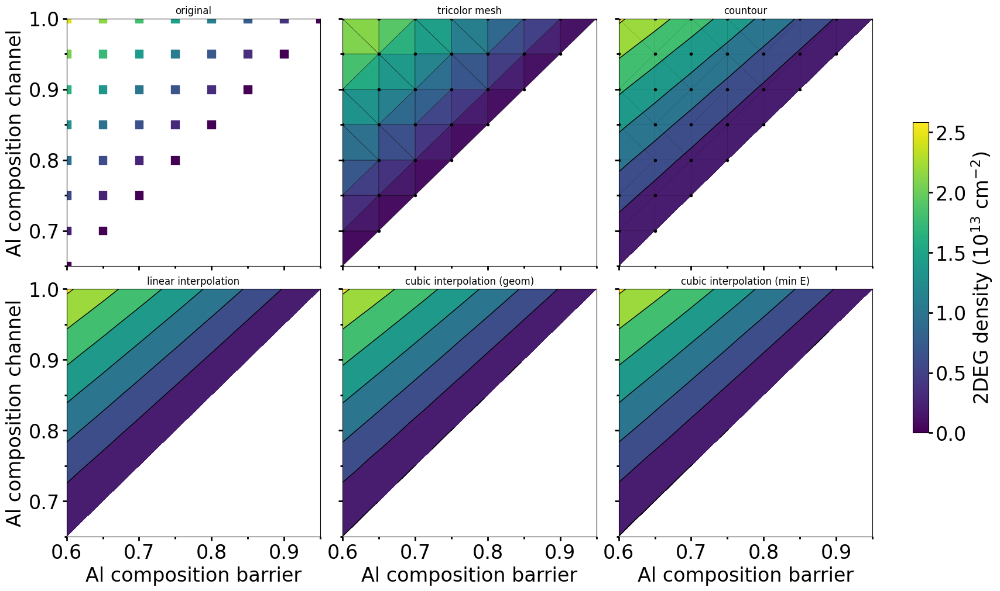

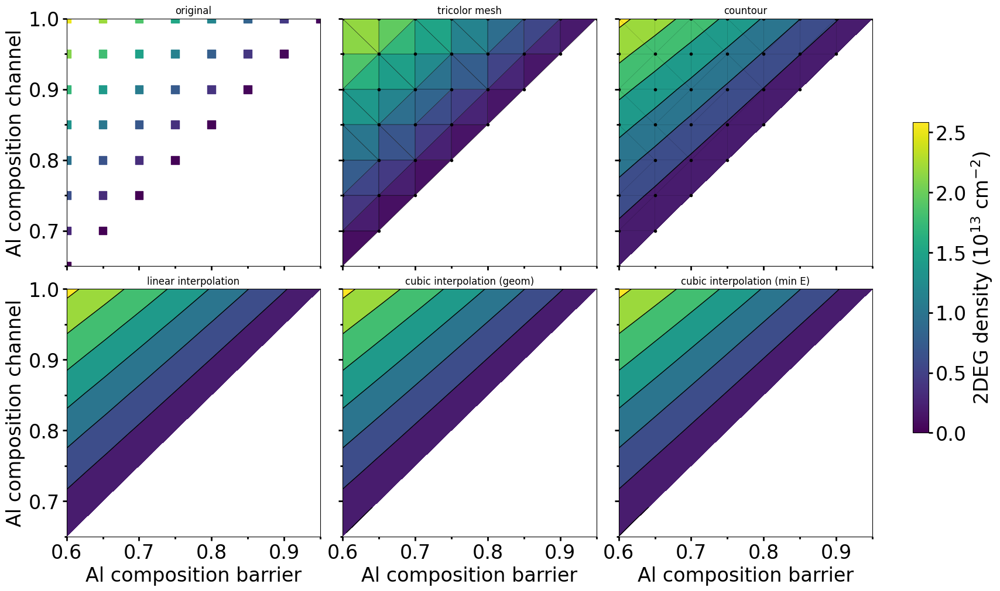

...

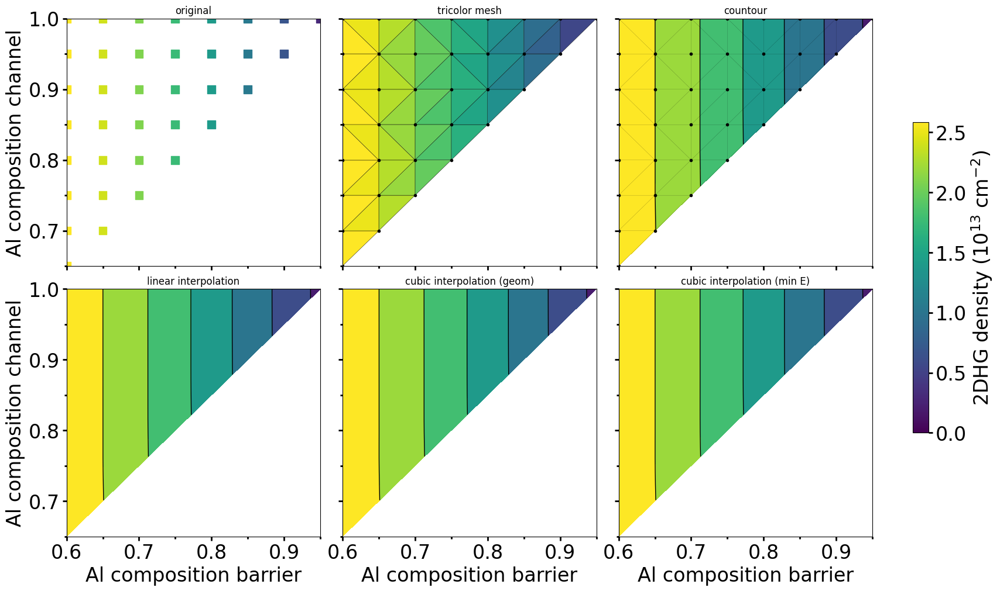

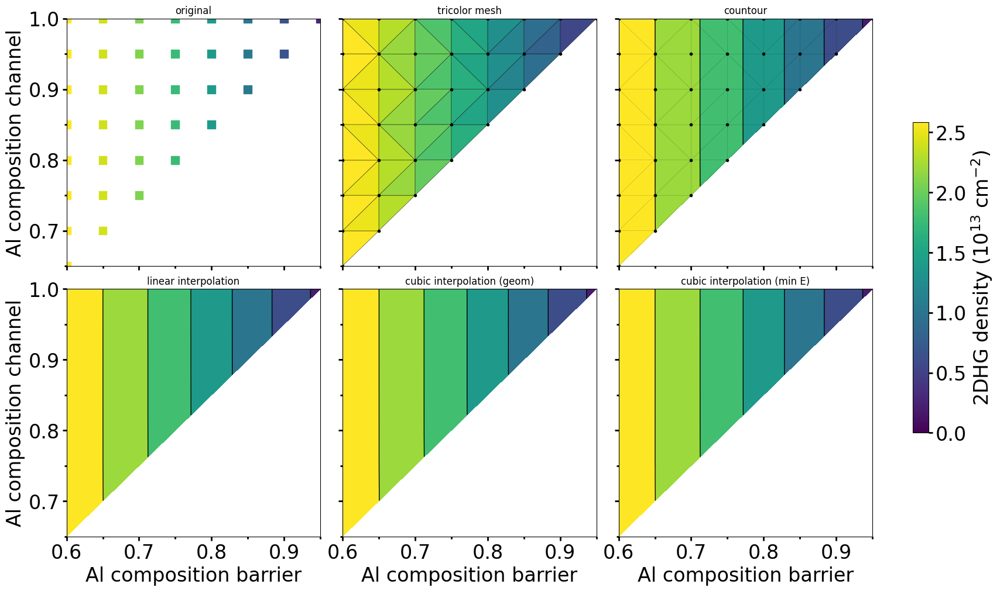

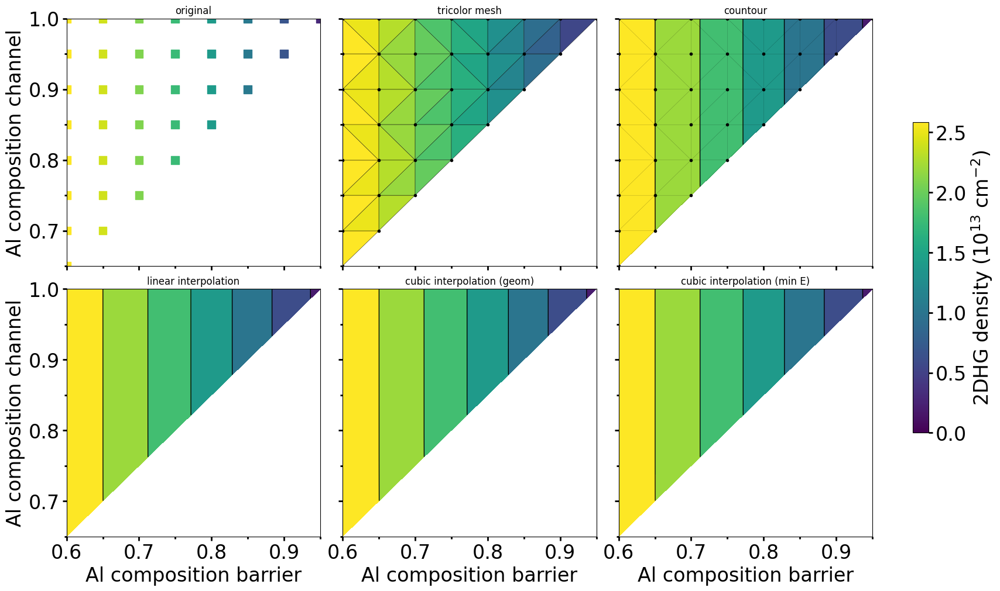

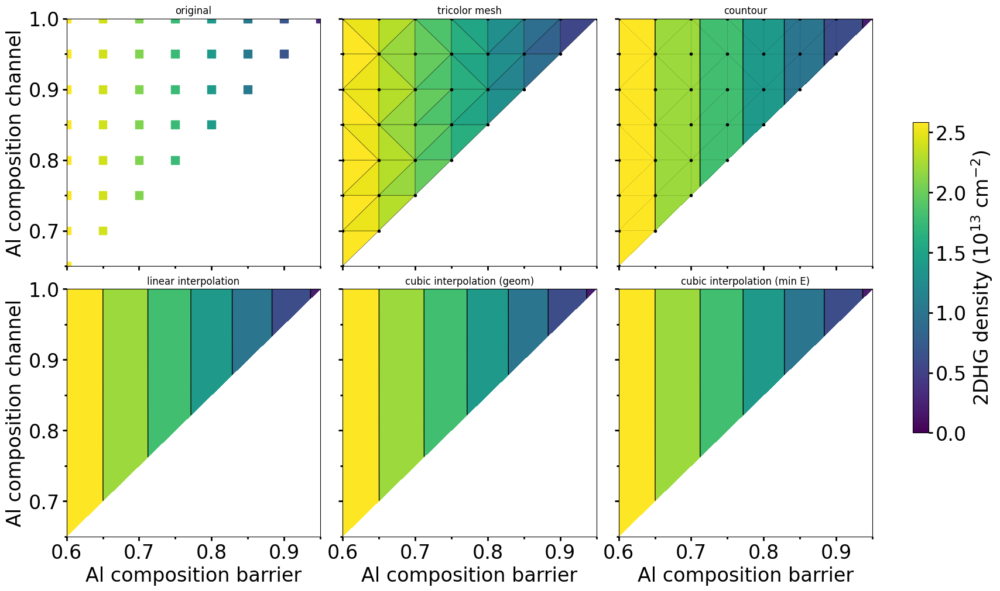

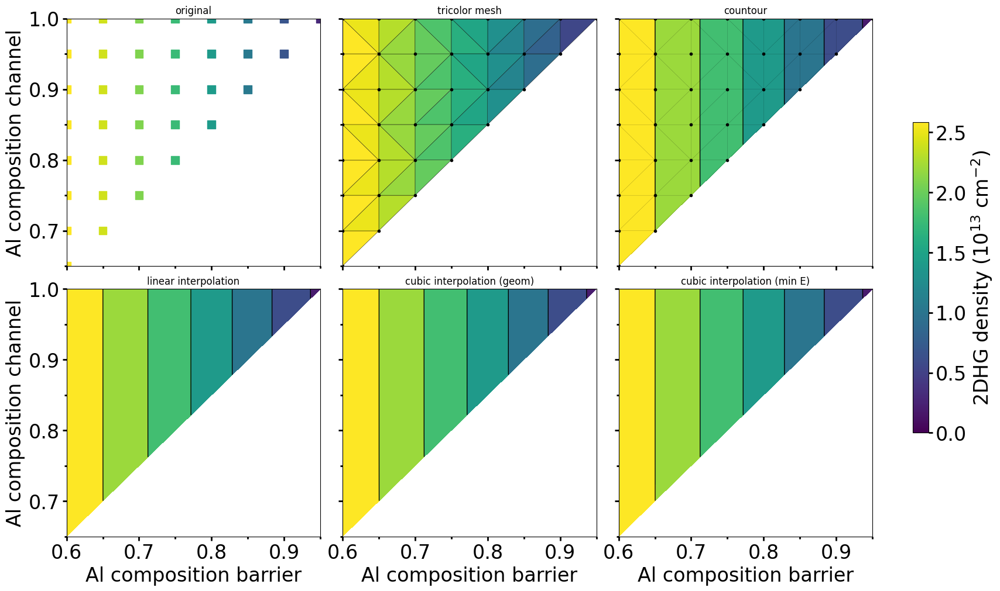

In [62]:
if perform_sweep_run and do_plot:
    rescale_y_fact = 1e13  # Rescalings 2DEG in 10^13 unit
    if len(SweepVariablesKeys) > 1:
        df_cap_thickness_group = df.groupby(['ThicknessAlGaNCap']) # Group by thickness
        x_label_text = 'Al composition barrier'
        y_label_text = 'Al composition channel'
        z_label_text = ['2DEG density ($10^{13}$ $\\mathrm{cm}^{-2}$)',
                        '2DHG density ($10^{13}$ $\\mathrm{cm}^{-2}$)']
        #============ 2D plot =====================================================
        vmin, vmax = df['2DEG_rescale'].min(), df['2DEG_rescale'].max()
        for iii, what_to_plot in enumerate(what_to_plots):
            for name, group in df_cap_thickness_group:
                print(f'Cap layer thickness - {what_to_plot} = {name[0]}')
                ##### 3.2.5.1 Generate data inculding interpolation
                XX, YY, ZZ = group['AlloyContentChannel'], group['AlloyContentCap'], group[f'{what_to_plot}_rescale']   
                # Triangulation
                triang = tri.Triangulation(XX, YY) 
                xi, yi = np.meshgrid(np.linspace(XX.min(), XX.max(), 20), np.linspace(YY.min(), YY.max(), 20))
                # Linear interpolation
                interp_lin = tri.LinearTriInterpolator(triang, ZZ)
                zi_lin = interp_lin(xi, yi)
                # Cubic interpolation: 
                ## 'min_E': (default) The derivatives at each node is computed to minimize a bending energy
                ## 'geom': The derivatives at each node is computed as a weighted average of relevant triangle normals. To be used for speed optimization (large grids).
                interp_cubic_geom = tri.CubicTriInterpolator(triang, ZZ, kind='geom')
                zi_cubic_geom = interp_cubic_geom(xi, yi)
                interp_cubic_min_E = tri.CubicTriInterpolator(triang, ZZ, kind='min_E')
                zi_cubic_min_E = interp_cubic_min_E(xi, yi)

                ##### 3.2.5.2 Plot composition map vs 2DEG
                # Set up the figure
                fig, axss = plt.subplots(nrows=2, ncols=3, figsize=(17, 10), sharex=True, sharey=True,
                                        constrained_layout=True)
                axs = axss.flatten()
        
                # Plot original data
                pcm0 = axs[0].scatter(XX, YY, c=ZZ, cmap = 'viridis', marker='s', s=100, vmin = vmin, vmax = vmax)
                axs[0].set_xlim(XX.min(), XX.max())
                axs[0].set_ylim(YY.min(), YY.max())
                axs[0].set_title('original', size=12)
                axs[0].set_ylabel(y_label_text)
                
                # Plot as triangular color mesh
                cs = axs[1].tripcolor(triang, ZZ, cmap = 'viridis', edgecolors ='k', vmin = vmin, vmax = vmax)
                axs[1].triplot(triang, 'k.-', lw=0.1)
                axs[1].set_xlim(XX.min(), XX.max())
                axs[1].set_ylim(YY.min(), YY.max())
                axs[1].set_title('tricolor mesh', size=12)
                
                # Plot the triangulation.
                cs = axs[2].tricontourf(triang, ZZ, vmin = vmin, vmax = vmax)
                axs[2].tricontour(cs, colors='k', linewidths=1)
                axs[2].triplot(triang, 'k.-', lw=0.1)
                axs[2].set_title('countour', size=12)
                
                # Plot linear interpolation to quad grid.
                cs = axs[3].contourf(xi, yi, zi_lin, vmin = vmin, vmax = vmax)
                axs[3].contour(cs, colors='k', linewidths=1)
                #axs[3].plot(xi, yi, 'k-', lw=0.5, alpha=0.5)
                #axs[3].plot(xi.T, yi.T, 'k-', lw=0.5, alpha=0.5)
                axs[3].set_title("linear interpolation", size=12)
                axs[3].set_ylabel(y_label_text)
                axs[3].set_xlabel(x_label_text)
                
                # Plot cubic interpolation to quad grid, kind=geom
                cs = axs[4].contourf(xi, yi, zi_cubic_geom, vmin = vmin, vmax = vmax)
                axs[4].contour(cs, colors='k', linewidths=1)
                #axs[4].plot(xi, yi, 'k-', lw=0.5, alpha=0.5)
                #axs[4].plot(xi.T, yi.T, 'k-', lw=0.5, alpha=0.5)
                axs[4].set_title("cubic interpolation (geom)", size=12)
                axs[4].set_xlabel(x_label_text)
                
                # Plot cubic interpolation to quad grid, kind=min_E
                cs = axs[5].contourf(xi, yi, zi_cubic_min_E, vmin = vmin, vmax = vmax)
                axs[5].contour(cs, colors='k', linewidths=1)
                #axs[5].plot(xi, yi, 'k-', lw=0.5, alpha=0.5)
                #axs[5].plot(xi.T, yi.T, 'k-', lw=0.5, alpha=0.5)
                axs[5].set_title("cubic interpolation (min E)", size=12)
                axs[5].set_xlabel(x_label_text)
        
                cbar = fig.colorbar(pcm0, ax=axss[:, :], location='right', shrink=0.6, label=z_label_text[iii])
        
                for ax_s in axs:
                    axs[0].xaxis.set_major_locator(ticker.MultipleLocator(base=0.1))
                    axs[0].xaxis.set_minor_locator(ticker.MultipleLocator(base=0.05))
                    axs[0].yaxis.set_major_locator(ticker.MultipleLocator(base=0.1))
                    axs[0].yaxis.set_minor_locator(ticker.MultipleLocator(base=0.05))

                if savefigure:
                    output_figs_sweep_tmp = os.path.join(output_figs_sweep, SweepVariablesFolder, f'{what_to_plot}_Full')
                    mkdir_if_not_exist(output_figs_sweep_tmp)
                    filename = f'ThicknessAlGaNCap_{name[0]:.2f}{FigFormat}'
                    fig.savefig(os.path.join(output_figs_sweep_tmp, filename)) 

Cap layer thickness - 2DEG = 5.0
Cap layer thickness - 2DEG = 10.0
Cap layer thickness - 2DEG = 15.0
Cap layer thickness - 2DEG = 20.0
Cap layer thickness - 2DEG = 25.0
Cap layer thickness - 2DEG = 30.0
Cap layer thickness - 2DEG = 35.0
Cap layer thickness - 2DEG = 40.0
Cap layer thickness - 2DHG = 5.0
Cap layer thickness - 2DHG = 10.0
Cap layer thickness - 2DHG = 15.0
Cap layer thickness - 2DHG = 20.0
Cap layer thickness - 2DHG = 25.0
Cap layer thickness - 2DHG = 30.0
Cap layer thickness - 2DHG = 35.0
Cap layer thickness - 2DHG = 40.0


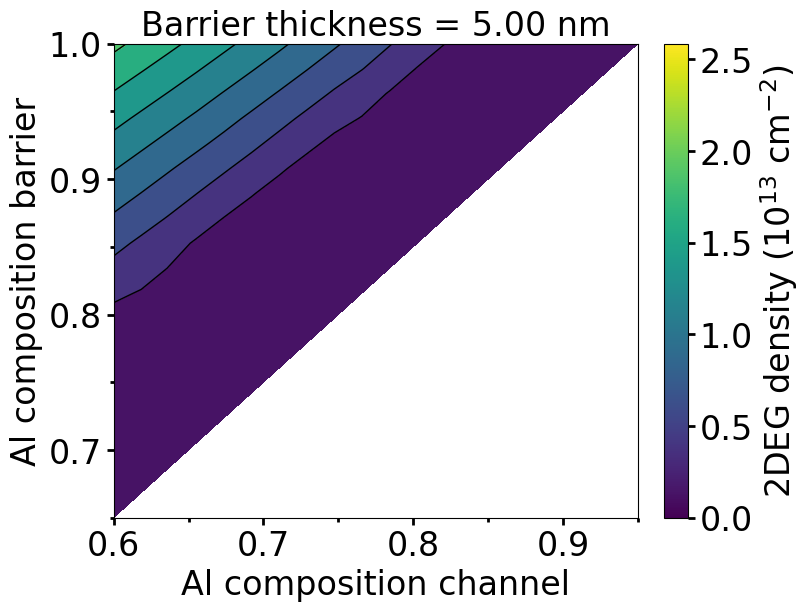

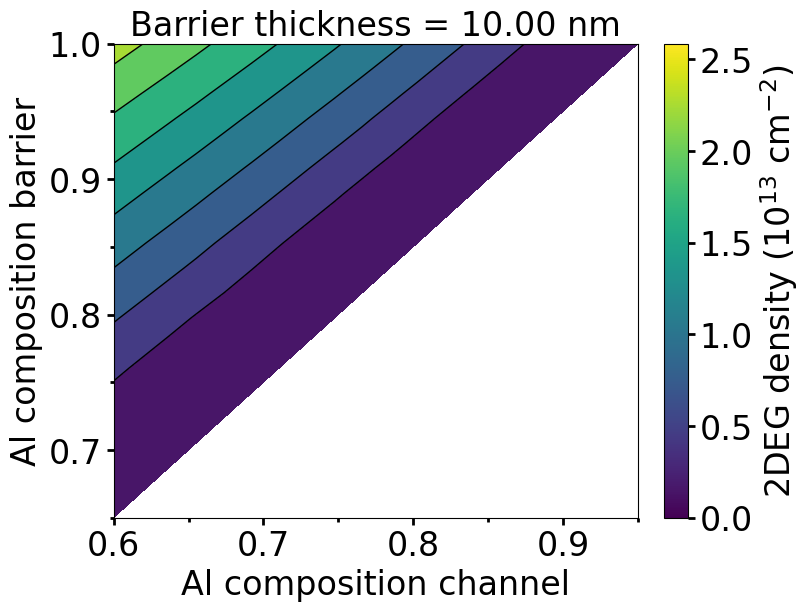

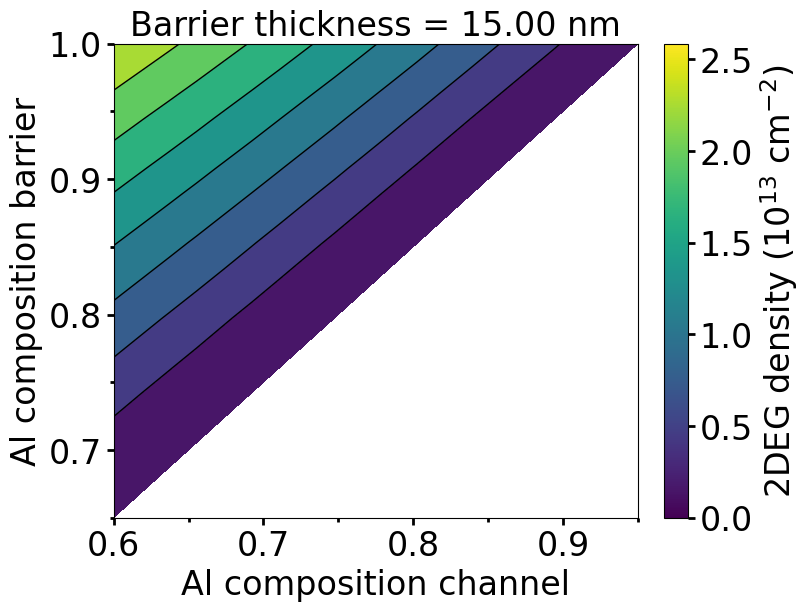

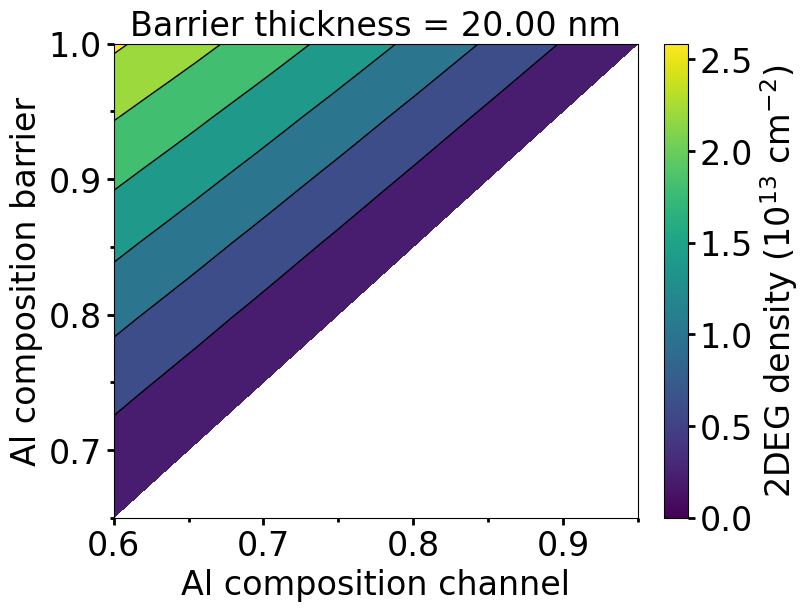

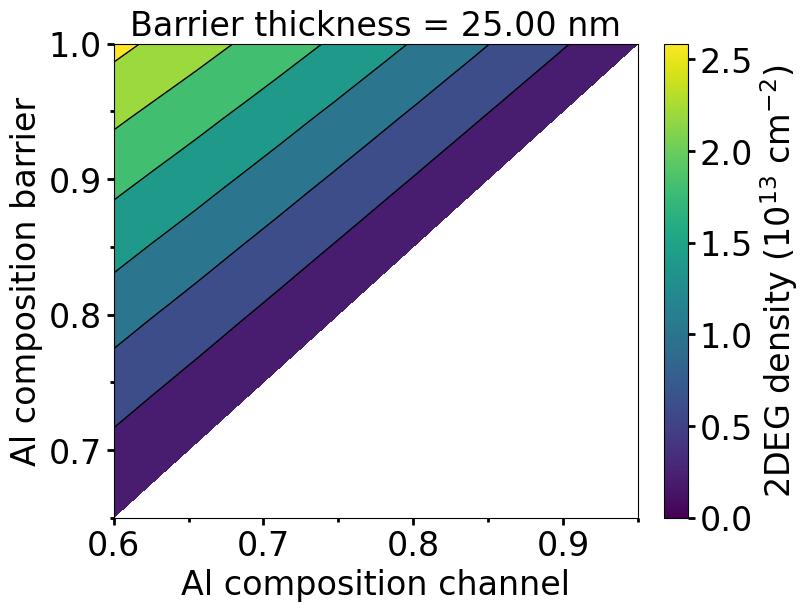

...

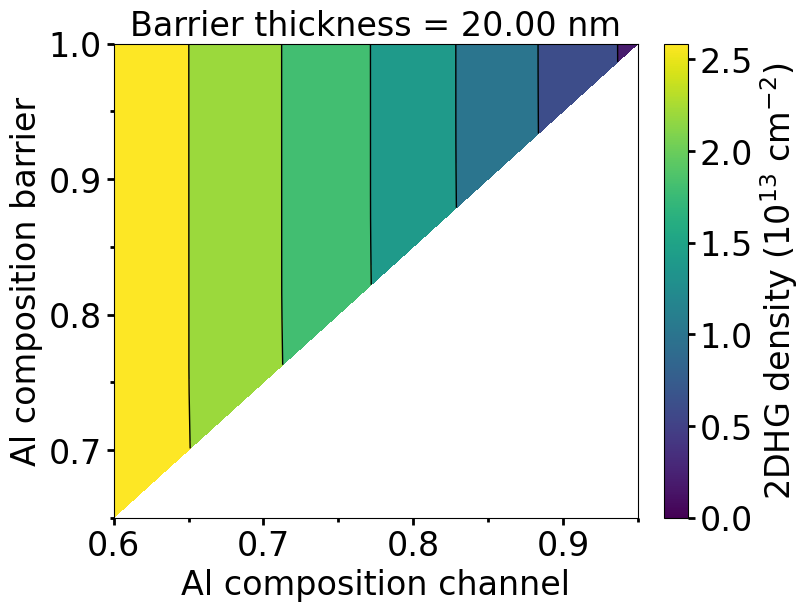

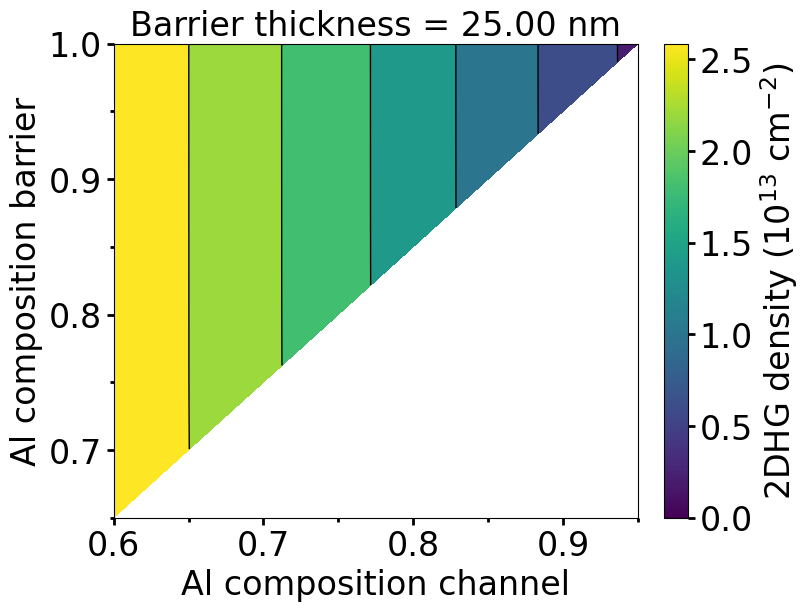

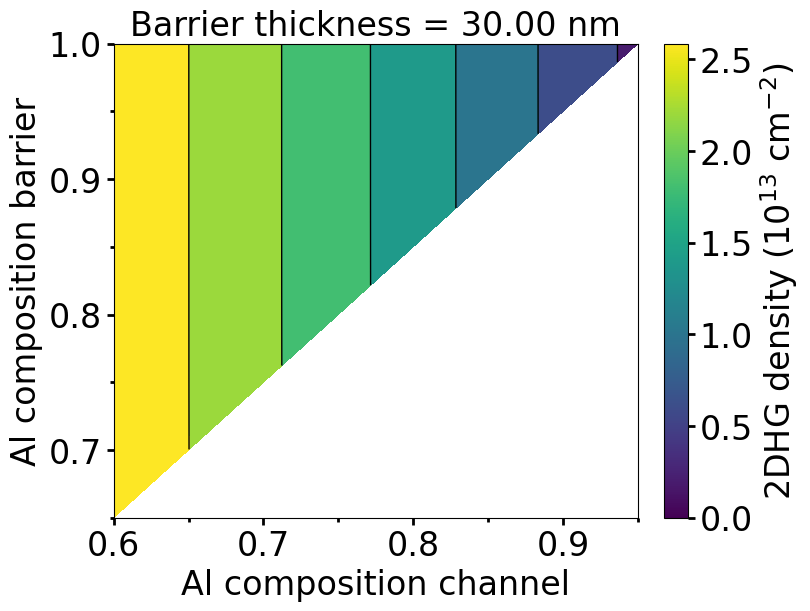

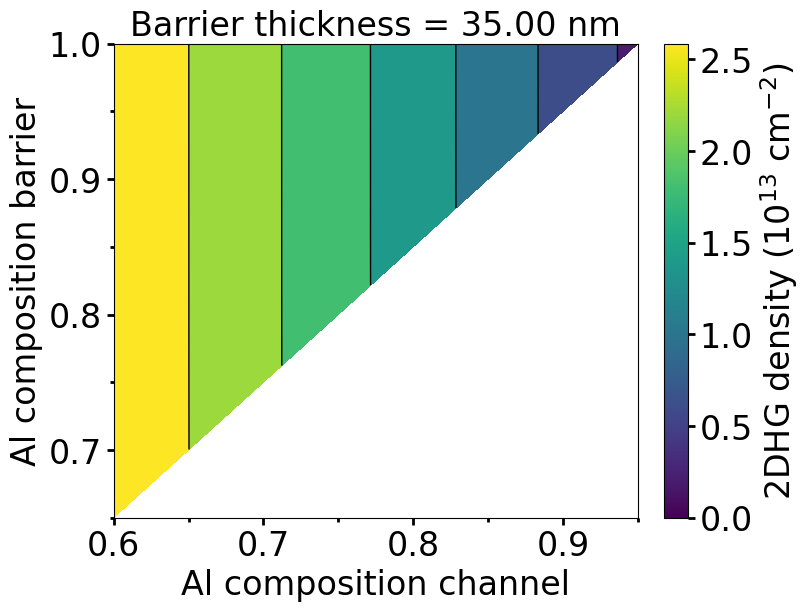

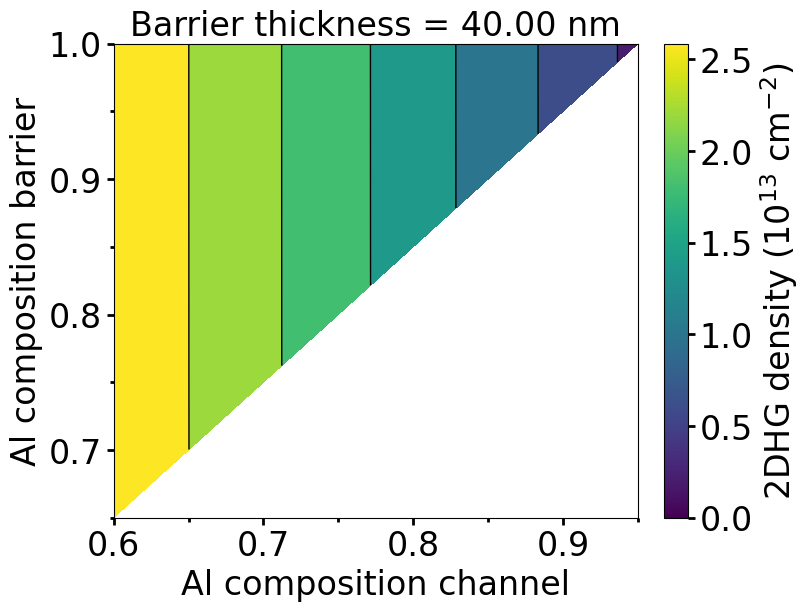

In [80]:
if perform_sweep_run and do_plot:
    rescale_y_fact = 1e13  # Rescalings 2DEG in 10^13 unit
    if len(SweepVariablesKeys) > 1:
        df_cap_thickness_group = df.groupby(['ThicknessAlGaNCap']) # Group by thickness
        x_label_text = 'Al composition channel'
        y_label_text = 'Al composition barrier'
        z_label_text = ['2DEG density ($10^{13}$ $\\mathrm{cm}^{-2}$)',
                        '2DHG density ($10^{13}$ $\\mathrm{cm}^{-2}$)']
        #============ 2D plot =====================================================
        vmin, vmax = df['2DEG_rescale'].min(), df['2DEG_rescale'].max()
        for iii, what_to_plot in enumerate(what_to_plots):
            for name, group in df_cap_thickness_group:
                print(f'Cap layer thickness - {what_to_plot} = {name[0]}')
                ##### 3.2.5.1 Generate data inculding interpolation
                XX, YY, ZZ = group['AlloyContentChannel'], group['AlloyContentCap'], group[f'{what_to_plot}_rescale']   
                # Triangulation
                triang = tri.Triangulation(XX, YY) 
                xi, yi = np.meshgrid(np.linspace(XX.min(), XX.max(), 20), np.linspace(YY.min(), YY.max(), 20))
                # Linear interpolation
                interp_lin = tri.LinearTriInterpolator(triang, ZZ)
                zi_lin = interp_lin(xi, yi)

                ##### 3.2.5.2 Plot composition map vs 2DEG
                # Set up the figure
                fig, axs = plt.subplots(figsize=(8, 6), constrained_layout=True)

                # Plot linear interpolation to quad grid.
                cs = axs.contourf(xi, yi, zi_lin, vmin = vmin, vmax = vmax)
                axs.contour(cs, colors='k', linewidths=1)
                # Plot the triangulation.
                #cs = axs.tricontourf(triang, ZZ, vmin = vmin, vmax = vmax)
                #axs.tricontour(cs, colors='k', linewidths=1)
                axs.set_ylabel(y_label_text)
                axs.set_xlabel(x_label_text)
                axs.set_title(f"Barrier thickness = {name[0]:.2f} nm")
                cbar = fig.colorbar(pcm0, ax=axs, location='right', label=z_label_text[iii])

                axs.xaxis.set_major_locator(ticker.MultipleLocator(base=0.1))
                axs.xaxis.set_minor_locator(ticker.MultipleLocator(base=0.05))
                axs.yaxis.set_major_locator(ticker.MultipleLocator(base=0.1))
                axs.yaxis.set_minor_locator(ticker.MultipleLocator(base=0.05))
                
                if savefigure:
                    output_figs_sweep_tmp = os.path.join(output_figs_sweep, SweepVariablesFolder, what_to_plot)
                    mkdir_if_not_exist(output_figs_sweep_tmp)
                    filename = f'ThicknessAlGaNCap_{name[0]:.2f}{FigFormat}'
                    fig.savefig(os.path.join(output_figs_sweep_tmp, filename)) 

In [72]:
if len(SweepVariablesKeys) > 1:
    df['AlloyContentCapRelative'] = (df['AlloyContentCap'] - df['AlloyContentChannel'])/df['AlloyContentChannel']

In [73]:
for_key = '2DEG'
df.loc[df[for_key] == df[for_key].max()]

,AlloyContentCap,AlloyContentChannel,ThicknessAlGaNCap,2DEG,2DHG,2DEG_rescale,2DHG_rescale,AlloyContentCapRelative
231,1.0,0.6,40.0,2.584659e+13,2.711250e+13,2.584659,2.71125,0.666667


In [74]:
df['2DEG_rescale'] =  df['2DEG']/rescale_y_fact
df['2DHG_rescale'] =  df['2DHG']/rescale_y_fact

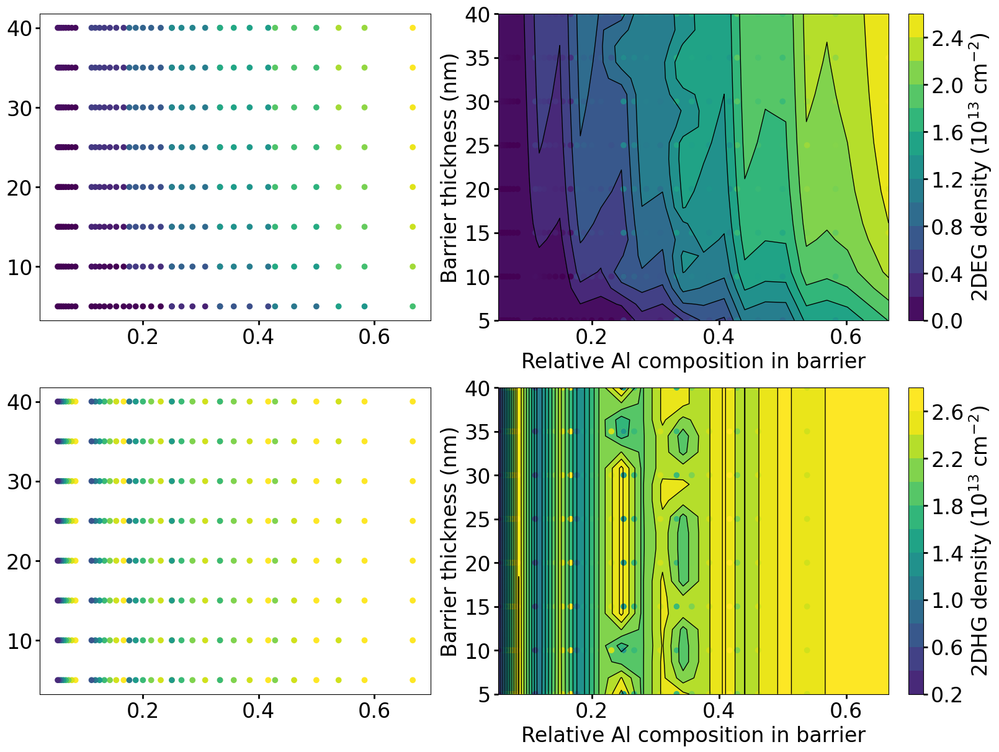

In [75]:
if perform_sweep_run and do_plot:
    if len(SweepVariablesKeys) > 1:
        x_label_text = 'Relative Al composition in barrier'
        y_label_text = 'Barrier thickness (nm)'
        z_label_text = ['2DEG density ($10^{13}$ $\\mathrm{cm}^{-2}$)',
                        '2DHG density ($10^{13}$ $\\mathrm{cm}^{-2}$)']
        #============ 2D plot =====================================================
        vmin, vmax = df['2DEG_rescale'].min(), df['2DEG_rescale'].max()
        fig, ax = plt.subplots(2, 2, figsize=(16,12),constrained_layout=True)
        for iii, what_to_plot in enumerate(what_to_plots):
            XX_, YY_, ZZ_ = df['AlloyContentCapRelative'], df['ThicknessAlGaNCap'], df[f'{what_to_plot}_rescale'].copy()
            # # Triangulation
            triang_ = tri.Triangulation(XX_, YY_) 
            xi, yi = np.meshgrid(np.linspace(XX_.min(), XX_.max(), 20), np.linspace(YY_.min(), YY_.max(), 20))
            # # Linear interpolation
            interp_lin = tri.LinearTriInterpolator(triang_, ZZ_)
            zi_lin = interp_lin(xi, yi)
            # #print(ZZ_)
            # # # # Cubic interpolation: 
            # # # ## 'geom': The derivatives at each node is computed as a weighted average of relevant triangle normals. To be used for speed optimization (large grids).
            # interp_cubic_geom = tri.CubicTriInterpolator(triang_, ZZ_, kind='geom')
            # zi_cubic_geom = interp_cubic_geom(xi, yi)
            
            ax[iii][0].scatter(XX_, YY_, c=ZZ_, vmin = vmin, vmax = vmax)
            pcm = ax[iii][1].contourf(xi, yi, zi_lin, vmin = vmin, vmax = vmax, levels=15)
            ax[iii][1].contour(pcm, colors='k', linewidths=1)
            ax[iii][1].scatter(XX_, YY_, c=ZZ_, vmin = vmin, vmax = vmax)
            cbar = fig.colorbar(pcm, ax=ax[iii][1], location='right', label=z_label_text[iii])
            ax[iii][1].set_xlabel(x_label_text)
            ax[iii][1].set_ylabel(y_label_text)
        if savefigure:
            filename = f'2DEHG_AlloyContentCapRelative_CapThickness{FigFormat}'
            fig.savefig(os.path.join(output_figs_sweep, filename)) 

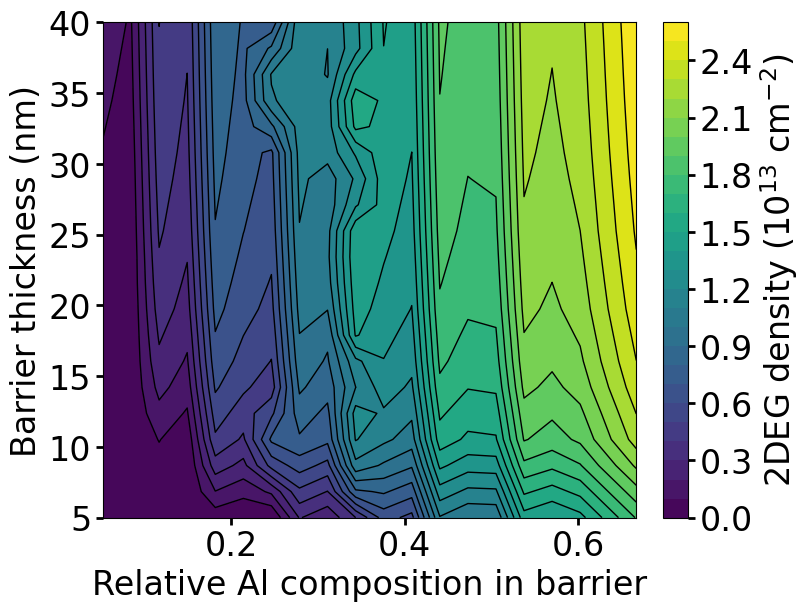

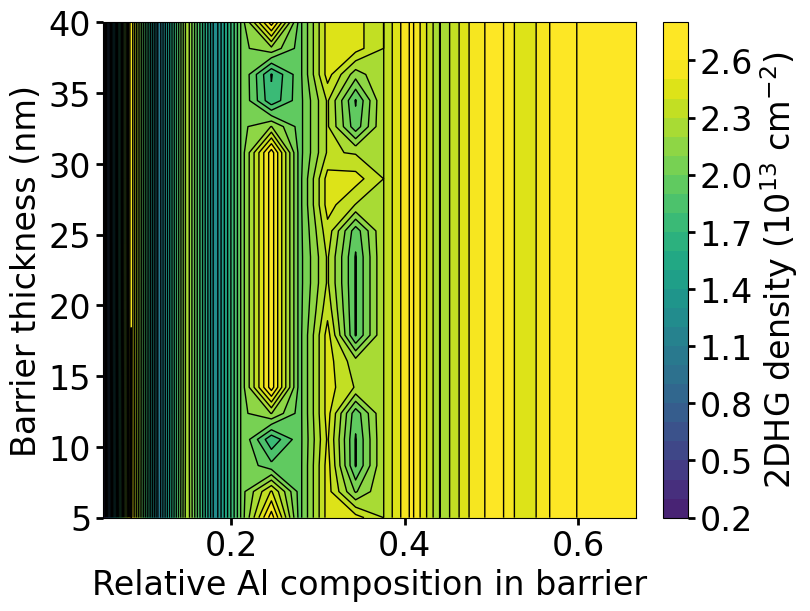

In [81]:
if perform_sweep_run and do_plot:
    if len(SweepVariablesKeys) > 1:
        x_label_text = 'Relative Al composition in barrier'
        y_label_text = 'Barrier thickness (nm)'
        z_label_text = ['2DEG density ($10^{13}$ $\\mathrm{cm}^{-2}$)',
                        '2DHG density ($10^{13}$ $\\mathrm{cm}^{-2}$)']
        #============ 2D plot =====================================================
        vmin, vmax = df['2DEG_rescale'].min(), df['2DEG_rescale'].max()
        
        for iii, what_to_plot in enumerate(what_to_plots):
            fig, ax = plt.subplots(figsize=(8,6),constrained_layout=True)
            XX_, YY_, ZZ_ = df['AlloyContentCapRelative'], df['ThicknessAlGaNCap'], df[f'{what_to_plot}_rescale'].copy()
            # # Triangulation
            triang_ = tri.Triangulation(XX_, YY_) 
            xi, yi = np.meshgrid(np.linspace(XX_.min(), XX_.max(), 20), np.linspace(YY_.min(), YY_.max(), 20))
            # # Linear interpolation
            interp_lin = tri.LinearTriInterpolator(triang_, ZZ_)
            zi_lin = interp_lin(xi, yi)
            
            pcm = ax.contourf(xi, yi, zi_lin, vmin = vmin, vmax = vmax, levels=25)
            ax.contour(pcm, colors='k', linewidths=1)
            cbar = fig.colorbar(pcm, ax=ax, location='right', label=z_label_text[iii])
            ax.set_xlabel(x_label_text)
            ax.set_ylabel(y_label_text)
            if savefigure:
                filename = f'{what_to_plot}_AlloyContentCapRelative_CapThickness{FigFormat}'
                fig.savefig(os.path.join(output_figs_sweep, filename)) 